# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    deeply_inject_disentengled_latents = False,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: urvexfi2
Name: treasured-totem-617
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/urvexfi2
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_115223-urvexfi2/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-e455f2f6-4cb9-5bc6-86b6-b11e202900ad]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 207,390,455,185,399,301,555,149,441,368,422,364,230,295,50,219,449,304,269,524,237,271,148,53,325,145,106,288,97,89,181,199,52,329,230,171,267,140,93,193,372,454,316,971,148,380,173,196,287,310,233,135,378,266,261,386,311,645,297,299,236,567,236,151,264,341,288,739,350,351,254,360,359,356,129,226,226,153,50,131,188,510,310,280,353,217,166,223,388,170,140,102,261,406,160,154,438,82,155,297,167,380,100,240,181,223,319,138,146,288,254,115,120,347,346,347,263,40,46,208,216,265,82,207,311,244,196,242,307,213,968,262,191,503,307,149,491,347,502,474,213,448,451,247,352,237,362,237,294,293,276,243,258,386,401,250,245,193,139,610,250,239,139,138,178,157,549,252,389,213,284,401,596,425,304,249,217,232,175,182,209,189,208,238,619,339,334,366,374,7108,420,293,191,165,374,168,262,269,163,31

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 69,91,103,47,96,78,132,26,141,95,111,100,71,63,9,45,113,61,79,139,69,64,40,11,85,39,28,76,29,18,49,46,12,83,56,40,64,40,21,44,96,112,99,248,31,95,42,45,68,88,52,43,92,62,68,92,76,142,85,67,54,164,61,32,58,84,66,166,91,94,70,99,92,89,30,58,51,38,21,20,59,120,72,65,73,55,26,72,91,46,35,28,68,88,32,46,114,14,38,71,48,83,26,63,56,51,91,29,37,80,95,25,21,98,81,97,64,14,13,58,62,64,14,47,84,67,41,56,54,50,229,75,50,144,68,43,132,85,124,107,48,123,128,91,99,63,82,65,69,73,63,59,61,114,96,63,53,44,53,160,60,54,37,48,37,45,118,63,91,56,61,111,154,88,68,73,67,59,43,40,55,47,47,67,144,95,78,80,89,1799,110,56,54,46,72,49,69,63,37,86,29,72,67,72,82,117,67,59,96,20,18,40,69,70,17,61,74,86,34,49,76,75,50,57,63,54,60,60,59,70,63,102,56,88,11,40,26,126,139,122,82,72,64,62,210,104,21,45,78,41,

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:42:45, 20.59s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:42:45, 20.59s/it, v_num=i2_1, total_loss_train=1.46e+3, kl_local_train=115]

Epoch 2/1000:   0%|          | 1/1000 [00:20<5:42:45, 20.59s/it, v_num=i2_1, total_loss_train=1.46e+3, kl_local_train=115]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:44:11, 13.48s/it, v_num=i2_1, total_loss_train=1.46e+3, kl_local_train=115]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:44:11, 13.48s/it, v_num=i2_1, total_loss_train=1.3e+3, kl_local_train=53.5]

Epoch 3/1000:   0%|          | 2/1000 [00:29<3:44:11, 13.48s/it, v_num=i2_1, total_loss_train=1.3e+3, kl_local_train=53.5]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:06:15, 11.21s/it, v_num=i2_1, total_loss_train=1.3e+3, kl_local_train=53.5]

Epoch 3/1000:   0%|          | 3/1000 [00:37<3:06:15, 11.21s/it, v_num=i2_1, total_loss_train=1.29e+3, kl_local_train=5.42]

Epoch 4/1000:   0%|          | 3/1000 [00:37<3:06:15, 11.21s/it, v_num=i2_1, total_loss_train=1.29e+3, kl_local_train=5.42]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:49:53, 10.23s/it, v_num=i2_1, total_loss_train=1.29e+3, kl_local_train=5.42]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:49:53, 10.23s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=2.71]

Epoch 5/1000:   0%|          | 4/1000 [00:46<2:49:53, 10.23s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=2.71]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:41:30,  9.74s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=2.71]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:41:30,  9.74s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=38.5]

Epoch 6/1000:   0%|          | 5/1000 [00:55<2:41:30,  9.74s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=38.5]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:36:46,  9.46s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=38.5]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:36:46,  9.46s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=30.8]

Epoch 7/1000:   1%|          | 6/1000 [01:04<2:36:46,  9.46s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=30.8]

Epoch 7/1000:   1%|          | 7/1000 [01:12<2:30:20,  9.08s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=30.8]

Epoch 7/1000:   1%|          | 7/1000 [01:12<2:30:20,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 7/1000 [01:12<2:30:20,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 8/1000 [01:21<2:27:29,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 8/1000 [01:21<2:27:29,  8.92s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=38]  

Epoch 9/1000:   1%|          | 8/1000 [01:21<2:27:29,  8.92s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=38]

Epoch 9/1000:   1%|          | 9/1000 [01:29<2:25:53,  8.83s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=38]

Epoch 9/1000:   1%|          | 9/1000 [01:29<2:25:53,  8.83s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=39.3]

Epoch 10/1000:   1%|          | 9/1000 [01:29<2:25:53,  8.83s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=39.3]

Epoch 10/1000:   1%|          | 10/1000 [01:38<2:28:19,  8.99s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=39.3]

Epoch 10/1000:   1%|          | 10/1000 [01:38<2:28:19,  8.99s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=39.3] 

Epoch 11/1000:   1%|          | 10/1000 [01:38<2:28:19,  8.99s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=39.3]

Epoch 11/1000:   1%|          | 11/1000 [01:48<2:29:17,  9.06s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=39.3]

Epoch 11/1000:   1%|          | 11/1000 [01:48<2:29:17,  9.06s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=40] 

Epoch 12/1000:   1%|          | 11/1000 [01:48<2:29:17,  9.06s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=40]

Epoch 12/1000:   1%|          | 12/1000 [01:57<2:29:03,  9.05s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=40]

Epoch 12/1000:   1%|          | 12/1000 [01:57<2:29:03,  9.05s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=41.1]

Epoch 13/1000:   1%|          | 12/1000 [01:57<2:29:03,  9.05s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=41.1]

Epoch 13/1000:   1%|▏         | 13/1000 [02:06<2:28:27,  9.03s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=41.1]

Epoch 13/1000:   1%|▏         | 13/1000 [02:06<2:28:27,  9.03s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=43.5]

Epoch 14/1000:   1%|▏         | 13/1000 [02:06<2:28:27,  9.03s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=43.5]

Epoch 14/1000:   1%|▏         | 14/1000 [02:14<2:26:27,  8.91s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=43.5]

Epoch 14/1000:   1%|▏         | 14/1000 [02:14<2:26:27,  8.91s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=45.8]

Epoch 15/1000:   1%|▏         | 14/1000 [02:14<2:26:27,  8.91s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=45.8]

Epoch 15/1000:   2%|▏         | 15/1000 [02:23<2:26:54,  8.95s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=45.8]

Epoch 15/1000:   2%|▏         | 15/1000 [02:23<2:26:54,  8.95s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 16/1000:   2%|▏         | 15/1000 [02:23<2:26:54,  8.95s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:32<2:26:59,  8.96s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=49.1]

Epoch 16/1000:   2%|▏         | 16/1000 [02:32<2:26:59,  8.96s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=52]  

Epoch 17/1000:   2%|▏         | 16/1000 [02:32<2:26:59,  8.96s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=52]

Epoch 17/1000:   2%|▏         | 17/1000 [02:41<2:24:34,  8.82s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=52]

Epoch 17/1000:   2%|▏         | 17/1000 [02:41<2:24:34,  8.82s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=54.4]

Epoch 18/1000:   2%|▏         | 17/1000 [02:41<2:24:34,  8.82s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=54.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:49<2:23:10,  8.75s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=54.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:49<2:23:10,  8.75s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 19/1000:   2%|▏         | 18/1000 [02:49<2:23:10,  8.75s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 19/1000:   2%|▏         | 19/1000 [02:58<2:22:32,  8.72s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 19/1000:   2%|▏         | 19/1000 [02:58<2:22:32,  8.72s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 20/1000:   2%|▏         | 19/1000 [02:58<2:22:32,  8.72s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 20/1000:   2%|▏         | 20/1000 [03:07<2:23:43,  8.80s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 20/1000:   2%|▏         | 20/1000 [03:07<2:23:43,  8.80s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=59.7]

Epoch 21/1000:   2%|▏         | 20/1000 [03:07<2:23:43,  8.80s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=59.7]

Epoch 21/1000:   2%|▏         | 21/1000 [03:16<2:25:42,  8.93s/it, v_num=i2_1, total_loss_train=1.18e+3, kl_local_train=59.7]

Epoch 21/1000:   2%|▏         | 21/1000 [03:16<2:25:42,  8.93s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=63.1]

Epoch 22/1000:   2%|▏         | 21/1000 [03:16<2:25:42,  8.93s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=63.1]

Epoch 22/1000:   2%|▏         | 22/1000 [03:25<2:24:44,  8.88s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=63.1]

Epoch 22/1000:   2%|▏         | 22/1000 [03:25<2:24:44,  8.88s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 23/1000:   2%|▏         | 22/1000 [03:25<2:24:44,  8.88s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 23/1000:   2%|▏         | 23/1000 [03:34<2:23:27,  8.81s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 23/1000:   2%|▏         | 23/1000 [03:34<2:23:27,  8.81s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69]  

Epoch 24/1000:   2%|▏         | 23/1000 [03:34<2:23:27,  8.81s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69]

Epoch 24/1000:   2%|▏         | 24/1000 [03:42<2:22:40,  8.77s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69]

Epoch 24/1000:   2%|▏         | 24/1000 [03:42<2:22:40,  8.77s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69.4]

Epoch 25/1000:   2%|▏         | 24/1000 [03:42<2:22:40,  8.77s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:51<2:23:42,  8.84s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=69.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:51<2:23:42,  8.84s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=73.2]

Epoch 26/1000:   2%|▎         | 25/1000 [03:51<2:23:42,  8.84s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=73.2]

Epoch 26/1000:   3%|▎         | 26/1000 [04:00<2:23:53,  8.86s/it, v_num=i2_1, total_loss_train=1.19e+3, kl_local_train=73.2]

Epoch 26/1000:   3%|▎         | 26/1000 [04:00<2:23:53,  8.86s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=73.6] 

Epoch 27/1000:   3%|▎         | 26/1000 [04:00<2:23:53,  8.86s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=73.6]

Epoch 27/1000:   3%|▎         | 27/1000 [04:09<2:24:31,  8.91s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=73.6]

Epoch 27/1000:   3%|▎         | 27/1000 [04:09<2:24:31,  8.91s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=74.3]

Epoch 28/1000:   3%|▎         | 27/1000 [04:09<2:24:31,  8.91s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=74.3]

Epoch 28/1000:   3%|▎         | 28/1000 [04:19<2:26:36,  9.05s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=74.3]

Epoch 28/1000:   3%|▎         | 28/1000 [04:19<2:26:36,  9.05s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=77.7]

Epoch 29/1000:   3%|▎         | 28/1000 [04:19<2:26:36,  9.05s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=77.7]

Epoch 29/1000:   3%|▎         | 29/1000 [04:28<2:25:52,  9.01s/it, v_num=i2_1, total_loss_train=1.2e+3, kl_local_train=77.7]

Epoch 29/1000:   3%|▎         | 29/1000 [04:28<2:25:52,  9.01s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 30/1000:   3%|▎         | 29/1000 [04:28<2:25:52,  9.01s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 30/1000:   3%|▎         | 30/1000 [04:36<2:24:06,  8.91s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 30/1000:   3%|▎         | 30/1000 [04:36<2:24:06,  8.91s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 31/1000:   3%|▎         | 30/1000 [04:36<2:24:06,  8.91s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 31/1000:   3%|▎         | 31/1000 [04:45<2:24:30,  8.95s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 31/1000:   3%|▎         | 31/1000 [04:45<2:24:30,  8.95s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.8]

Epoch 32/1000:   3%|▎         | 31/1000 [04:45<2:24:30,  8.95s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.8]

Epoch 32/1000:   3%|▎         | 32/1000 [04:54<2:22:42,  8.85s/it, v_num=i2_1, total_loss_train=1.21e+3, kl_local_train=80.8]

Epoch 32/1000:   3%|▎         | 32/1000 [04:54<2:22:42,  8.85s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=84.9]

Epoch 33/1000:   3%|▎         | 32/1000 [04:54<2:22:42,  8.85s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=84.9]

Epoch 33/1000:   3%|▎         | 33/1000 [05:03<2:21:31,  8.78s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=84.9]

Epoch 33/1000:   3%|▎         | 33/1000 [05:03<2:21:31,  8.78s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 34/1000:   3%|▎         | 33/1000 [05:03<2:21:31,  8.78s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 34/1000:   3%|▎         | 34/1000 [05:11<2:21:16,  8.77s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 34/1000:   3%|▎         | 34/1000 [05:11<2:21:16,  8.77s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83]  

Epoch 35/1000:   3%|▎         | 34/1000 [05:11<2:21:16,  8.77s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83]

Epoch 35/1000:   4%|▎         | 35/1000 [05:20<2:21:59,  8.83s/it, v_num=i2_1, total_loss_train=1.22e+3, kl_local_train=83]

Epoch 35/1000:   4%|▎         | 35/1000 [05:20<2:21:59,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.7]

Epoch 36/1000:   4%|▎         | 35/1000 [05:20<2:21:59,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.7]

Epoch 36/1000:   4%|▎         | 36/1000 [05:29<2:22:38,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.7]

Epoch 36/1000:   4%|▎         | 36/1000 [05:29<2:22:38,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=88.2]

Epoch 37/1000:   4%|▎         | 36/1000 [05:29<2:22:38,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=88.2]

Epoch 37/1000:   4%|▎         | 37/1000 [05:38<2:21:40,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=88.2]

Epoch 37/1000:   4%|▎         | 37/1000 [05:38<2:21:40,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.1]

Epoch 38/1000:   4%|▎         | 37/1000 [05:38<2:21:40,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.1]

Epoch 38/1000:   4%|▍         | 38/1000 [05:47<2:21:21,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=85.1]

Epoch 38/1000:   4%|▍         | 38/1000 [05:47<2:21:21,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=86.6]

Epoch 39/1000:   4%|▍         | 38/1000 [05:47<2:21:21,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=86.6]

Epoch 39/1000:   4%|▍         | 39/1000 [05:56<2:22:23,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=86.6]

Epoch 39/1000:   4%|▍         | 39/1000 [05:56<2:22:23,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=90.7]

Epoch 40/1000:   4%|▍         | 39/1000 [05:56<2:22:23,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=90.7]

Epoch 40/1000:   4%|▍         | 40/1000 [06:05<2:23:00,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=90.7]

Epoch 40/1000:   4%|▍         | 40/1000 [06:05<2:23:00,  8.94s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=86.4]

Epoch 41/1000:   4%|▍         | 40/1000 [06:05<2:23:00,  8.94s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=86.4]

Epoch 41/1000:   4%|▍         | 41/1000 [06:14<2:24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=86.4]

Epoch 41/1000:   4%|▍         | 41/1000 [06:14<2:24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=85.6]

Epoch 42/1000:   4%|▍         | 41/1000 [06:14<2:24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=85.6]

Epoch 42/1000:   4%|▍         | 42/1000 [06:23<2:23:02,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=85.6]

Epoch 42/1000:   4%|▍         | 42/1000 [06:23<2:23:02,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=90.3]

Epoch 43/1000:   4%|▍         | 42/1000 [06:23<2:23:02,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=90.3]

Epoch 43/1000:   4%|▍         | 43/1000 [06:32<2:23:37,  9.00s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=90.3]

Epoch 43/1000:   4%|▍         | 43/1000 [06:32<2:23:37,  9.00s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=85.6]

Epoch 44/1000:   4%|▍         | 43/1000 [06:32<2:23:37,  9.00s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=85.6]

Epoch 44/1000:   4%|▍         | 44/1000 [06:41<2:21:58,  8.91s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=85.6]

Epoch 44/1000:   4%|▍         | 44/1000 [06:41<2:21:58,  8.91s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=86.9]

Epoch 45/1000:   4%|▍         | 44/1000 [06:41<2:21:58,  8.91s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=86.9]

Epoch 45/1000:   4%|▍         | 45/1000 [06:50<2:20:59,  8.86s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=86.9]

Epoch 45/1000:   4%|▍         | 45/1000 [06:50<2:20:59,  8.86s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=89.8]

Epoch 46/1000:   4%|▍         | 45/1000 [06:50<2:20:59,  8.86s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=89.8]

Epoch 46/1000:   5%|▍         | 46/1000 [06:58<2:20:10,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=89.8]

Epoch 46/1000:   5%|▍         | 46/1000 [06:58<2:20:10,  8.82s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=87.9]

Epoch 47/1000:   5%|▍         | 46/1000 [06:58<2:20:10,  8.82s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=87.9]

Epoch 47/1000:   5%|▍         | 47/1000 [07:07<2:21:09,  8.89s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=87.9]

Epoch 47/1000:   5%|▍         | 47/1000 [07:07<2:21:09,  8.89s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=91.4]

Epoch 48/1000:   5%|▍         | 47/1000 [07:07<2:21:09,  8.89s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=91.4]

Epoch 48/1000:   5%|▍         | 48/1000 [07:16<2:20:12,  8.84s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=91.4]

Epoch 48/1000:   5%|▍         | 48/1000 [07:16<2:20:12,  8.84s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=90.2]

Epoch 49/1000:   5%|▍         | 48/1000 [07:16<2:20:12,  8.84s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=90.2]

Epoch 49/1000:   5%|▍         | 49/1000 [07:25<2:21:13,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=90.2]

Epoch 49/1000:   5%|▍         | 49/1000 [07:25<2:21:13,  8.91s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=98.1]

Epoch 50/1000:   5%|▍         | 49/1000 [07:25<2:21:13,  8.91s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=98.1]

Epoch 50/1000:   5%|▌         | 50/1000 [07:34<2:21:24,  8.93s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=98.1]

Epoch 50/1000:   5%|▌         | 50/1000 [07:34<2:21:24,  8.93s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=92.7]

Epoch 51/1000:   5%|▌         | 50/1000 [07:34<2:21:24,  8.93s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=92.7]

Epoch 51/1000:   5%|▌         | 51/1000 [07:43<2:19:54,  8.85s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=92.7]

Epoch 51/1000:   5%|▌         | 51/1000 [07:43<2:19:54,  8.85s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=89.8]

Epoch 52/1000:   5%|▌         | 51/1000 [07:43<2:19:54,  8.85s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=89.8]

Epoch 52/1000:   5%|▌         | 52/1000 [07:51<2:18:46,  8.78s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=89.8]

Epoch 52/1000:   5%|▌         | 52/1000 [07:51<2:18:46,  8.78s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=91.1]

Epoch 53/1000:   5%|▌         | 52/1000 [07:51<2:18:46,  8.78s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=91.1]

Epoch 53/1000:   5%|▌         | 53/1000 [08:00<2:18:42,  8.79s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=91.1]

Epoch 53/1000:   5%|▌         | 53/1000 [08:00<2:18:42,  8.79s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.5]

Epoch 54/1000:   5%|▌         | 53/1000 [08:00<2:18:42,  8.79s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.5]

Epoch 54/1000:   5%|▌         | 54/1000 [08:09<2:19:42,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.5]

Epoch 54/1000:   5%|▌         | 54/1000 [08:09<2:19:42,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=88.7]

Epoch 55/1000:   5%|▌         | 54/1000 [08:09<2:19:42,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=88.7]

Epoch 55/1000:   6%|▌         | 55/1000 [08:18<2:20:33,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=88.7]

Epoch 55/1000:   6%|▌         | 55/1000 [08:18<2:20:33,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.3]

Epoch 56/1000:   6%|▌         | 55/1000 [08:18<2:20:33,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.3]

Epoch 56/1000:   6%|▌         | 56/1000 [08:27<2:19:23,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=87.3]

Epoch 56/1000:   6%|▌         | 56/1000 [08:27<2:19:23,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=86.6]

Epoch 57/1000:   6%|▌         | 56/1000 [08:27<2:19:23,  8.86s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=86.6]

Epoch 57/1000:   6%|▌         | 57/1000 [08:36<2:20:14,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=86.6]

Epoch 57/1000:   6%|▌         | 57/1000 [08:36<2:20:14,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 58/1000:   6%|▌         | 57/1000 [08:36<2:20:14,  8.92s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 58/1000:   6%|▌         | 58/1000 [08:45<2:19:28,  8.88s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.4]

Epoch 58/1000:   6%|▌         | 58/1000 [08:45<2:19:28,  8.88s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 59/1000:   6%|▌         | 58/1000 [08:45<2:19:28,  8.88s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 59/1000:   6%|▌         | 59/1000 [08:54<2:20:11,  8.94s/it, v_num=i2_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 59/1000:   6%|▌         | 59/1000 [08:54<2:20:11,  8.94s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 59/1000 [08:54<2:20:11,  8.94s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 60/1000 [09:03<2:20:47,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 60/1000 [09:03<2:20:47,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=79.2]

Epoch 61/1000:   6%|▌         | 60/1000 [09:03<2:20:47,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=79.2]

Epoch 61/1000:   6%|▌         | 61/1000 [09:12<2:19:21,  8.90s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=79.2]

Epoch 61/1000:   6%|▌         | 61/1000 [09:12<2:19:21,  8.90s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 62/1000:   6%|▌         | 61/1000 [09:12<2:19:21,  8.90s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 62/1000:   6%|▌         | 62/1000 [09:21<2:21:26,  9.05s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 62/1000:   6%|▌         | 62/1000 [09:21<2:21:26,  9.05s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=74.7]

Epoch 63/1000:   6%|▌         | 62/1000 [09:21<2:21:26,  9.05s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=74.7]

Epoch 63/1000:   6%|▋         | 63/1000 [09:30<2:21:30,  9.06s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=74.7]

Epoch 63/1000:   6%|▋         | 63/1000 [09:30<2:21:30,  9.06s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 64/1000:   6%|▋         | 63/1000 [09:30<2:21:30,  9.06s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 64/1000:   6%|▋         | 64/1000 [09:39<2:19:40,  8.95s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 64/1000:   6%|▋         | 64/1000 [09:39<2:19:40,  8.95s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75]  

Epoch 65/1000:   6%|▋         | 64/1000 [09:39<2:19:40,  8.95s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75]

Epoch 65/1000:   6%|▋         | 65/1000 [09:48<2:18:53,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75]

Epoch 65/1000:   6%|▋         | 65/1000 [09:48<2:18:53,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.5]

Epoch 66/1000:   6%|▋         | 65/1000 [09:48<2:18:53,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.5]

Epoch 66/1000:   7%|▋         | 66/1000 [09:57<2:19:39,  8.97s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77.5]

Epoch 66/1000:   7%|▋         | 66/1000 [09:57<2:19:39,  8.97s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77]  

Epoch 67/1000:   7%|▋         | 66/1000 [09:57<2:19:39,  8.97s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77]

Epoch 67/1000:   7%|▋         | 67/1000 [10:06<2:19:49,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=77]

Epoch 67/1000:   7%|▋         | 67/1000 [10:06<2:19:49,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.5]

Epoch 68/1000:   7%|▋         | 67/1000 [10:06<2:19:49,  8.99s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.5]

Epoch 68/1000:   7%|▋         | 68/1000 [10:15<2:20:18,  9.03s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.5]

Epoch 68/1000:   7%|▋         | 68/1000 [10:15<2:20:18,  9.03s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.4]

Epoch 69/1000:   7%|▋         | 68/1000 [10:15<2:20:18,  9.03s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.4]

Epoch 69/1000:   7%|▋         | 69/1000 [10:24<2:18:18,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=75.4]

Epoch 69/1000:   7%|▋         | 69/1000 [10:24<2:18:18,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=73.2]

Epoch 70/1000:   7%|▋         | 69/1000 [10:24<2:18:18,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=73.2]

Epoch 70/1000:   7%|▋         | 70/1000 [10:32<2:16:53,  8.83s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=73.2]

Epoch 70/1000:   7%|▋         | 70/1000 [10:32<2:16:53,  8.83s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 71/1000:   7%|▋         | 70/1000 [10:32<2:16:53,  8.83s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 71/1000:   7%|▋         | 71/1000 [10:41<2:17:21,  8.87s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=71.4]

Epoch 71/1000:   7%|▋         | 71/1000 [10:41<2:17:21,  8.87s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.3]

Epoch 72/1000:   7%|▋         | 71/1000 [10:41<2:17:21,  8.87s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.3]

Epoch 72/1000:   7%|▋         | 72/1000 [10:50<2:17:50,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.3]

Epoch 72/1000:   7%|▋         | 72/1000 [10:50<2:17:50,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.7]

Epoch 73/1000:   7%|▋         | 72/1000 [10:50<2:17:50,  8.91s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.7]

Epoch 73/1000:   7%|▋         | 73/1000 [10:59<2:17:55,  8.93s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=70.7]

Epoch 73/1000:   7%|▋         | 73/1000 [10:59<2:17:55,  8.93s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=68]  

Epoch 74/1000:   7%|▋         | 73/1000 [10:59<2:17:55,  8.93s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=68]

Epoch 74/1000:   7%|▋         | 74/1000 [11:08<2:18:14,  8.96s/it, v_num=i2_1, total_loss_train=1.27e+3, kl_local_train=68]

Epoch 74/1000:   7%|▋         | 74/1000 [11:08<2:18:14,  8.96s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.8]

Epoch 75/1000:   7%|▋         | 74/1000 [11:08<2:18:14,  8.96s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.8]

Epoch 75/1000:   8%|▊         | 75/1000 [11:17<2:17:54,  8.95s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.8]

Epoch 75/1000:   8%|▊         | 75/1000 [11:17<2:17:54,  8.95s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.6]

Epoch 76/1000:   8%|▊         | 75/1000 [11:17<2:17:54,  8.95s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.6]

Epoch 76/1000:   8%|▊         | 76/1000 [11:26<2:17:23,  8.92s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.6]

Epoch 76/1000:   8%|▊         | 76/1000 [11:26<2:17:23,  8.92s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 77/1000:   8%|▊         | 76/1000 [11:26<2:17:23,  8.92s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 77/1000:   8%|▊         | 77/1000 [11:35<2:17:18,  8.93s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 77/1000:   8%|▊         | 77/1000 [11:35<2:17:18,  8.93s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 78/1000:   8%|▊         | 77/1000 [11:35<2:17:18,  8.93s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 78/1000:   8%|▊         | 78/1000 [11:44<2:15:34,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.1]

Epoch 78/1000:   8%|▊         | 78/1000 [11:44<2:15:34,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.1]

Epoch 79/1000:   8%|▊         | 78/1000 [11:44<2:15:34,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.1]

Epoch 79/1000:   8%|▊         | 79/1000 [11:53<2:17:42,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=69.1]

Epoch 79/1000:   8%|▊         | 79/1000 [11:53<2:17:42,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=66.9]

Epoch 80/1000:   8%|▊         | 79/1000 [11:53<2:17:42,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=66.9]

Epoch 80/1000:   8%|▊         | 80/1000 [12:01<2:16:07,  8.88s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=66.9]

Epoch 80/1000:   8%|▊         | 80/1000 [12:01<2:16:07,  8.88s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 81/1000:   8%|▊         | 80/1000 [12:01<2:16:07,  8.88s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 81/1000:   8%|▊         | 81/1000 [12:10<2:14:34,  8.79s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=67.3]

Epoch 81/1000:   8%|▊         | 81/1000 [12:10<2:14:34,  8.79s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=65.2]

Epoch 82/1000:   8%|▊         | 81/1000 [12:10<2:14:34,  8.79s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=65.2]

Epoch 82/1000:   8%|▊         | 82/1000 [12:19<2:13:47,  8.74s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=65.2]

Epoch 82/1000:   8%|▊         | 82/1000 [12:19<2:13:47,  8.74s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64]  

Epoch 83/1000:   8%|▊         | 82/1000 [12:19<2:13:47,  8.74s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64]

Epoch 83/1000:   8%|▊         | 83/1000 [12:27<2:13:01,  8.70s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64]

Epoch 83/1000:   8%|▊         | 83/1000 [12:27<2:13:01,  8.70s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.7]

Epoch 84/1000:   8%|▊         | 83/1000 [12:27<2:13:01,  8.70s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.7]

Epoch 84/1000:   8%|▊         | 84/1000 [12:36<2:12:30,  8.68s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.7]

Epoch 84/1000:   8%|▊         | 84/1000 [12:36<2:12:30,  8.68s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.6]

Epoch 85/1000:   8%|▊         | 84/1000 [12:36<2:12:30,  8.68s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.6]

Epoch 85/1000:   8%|▊         | 85/1000 [12:45<2:12:11,  8.67s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.6]

Epoch 85/1000:   8%|▊         | 85/1000 [12:45<2:12:11,  8.67s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 86/1000:   8%|▊         | 85/1000 [12:45<2:12:11,  8.67s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 86/1000:   9%|▊         | 86/1000 [12:54<2:14:23,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 86/1000:   9%|▊         | 86/1000 [12:54<2:14:23,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64.8]

Epoch 87/1000:   9%|▊         | 86/1000 [12:54<2:14:23,  8.82s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64.8]

Epoch 87/1000:   9%|▊         | 87/1000 [13:03<2:16:03,  8.94s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=64.8]

Epoch 87/1000:   9%|▊         | 87/1000 [13:03<2:16:03,  8.94s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=62.3]

Epoch 88/1000:   9%|▊         | 87/1000 [13:03<2:16:03,  8.94s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=62.3]

Epoch 88/1000:   9%|▉         | 88/1000 [13:12<2:16:18,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=62.3]

Epoch 88/1000:   9%|▉         | 88/1000 [13:12<2:16:18,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.8]

Epoch 89/1000:   9%|▉         | 88/1000 [13:12<2:16:18,  8.97s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.8]

Epoch 89/1000:   9%|▉         | 89/1000 [13:21<2:17:39,  9.07s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.8]

Epoch 89/1000:   9%|▉         | 89/1000 [13:21<2:17:39,  9.07s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 90/1000:   9%|▉         | 89/1000 [13:21<2:17:39,  9.07s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 90/1000:   9%|▉         | 90/1000 [13:30<2:15:52,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.6]

Epoch 90/1000:   9%|▉         | 90/1000 [13:30<2:15:52,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=63.6]

Epoch 91/1000:   9%|▉         | 90/1000 [13:30<2:15:52,  8.96s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=63.6]

Epoch 91/1000:   9%|▉         | 91/1000 [13:39<2:14:24,  8.87s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=63.6]

Epoch 91/1000:   9%|▉         | 91/1000 [13:39<2:14:24,  8.87s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.3]

Epoch 92/1000:   9%|▉         | 91/1000 [13:39<2:14:24,  8.87s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.3]

Epoch 92/1000:   9%|▉         | 92/1000 [13:48<2:15:04,  8.93s/it, v_num=i2_1, total_loss_train=1.26e+3, kl_local_train=63.3]

Epoch 92/1000:   9%|▉         | 92/1000 [13:48<2:15:04,  8.93s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.8]

Epoch 93/1000:   9%|▉         | 92/1000 [13:48<2:15:04,  8.93s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.8]

Epoch 93/1000:   9%|▉         | 93/1000 [13:56<2:13:56,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.8]

Epoch 93/1000:   9%|▉         | 93/1000 [13:56<2:13:56,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 94/1000:   9%|▉         | 93/1000 [13:56<2:13:56,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 94/1000:   9%|▉         | 94/1000 [14:05<2:14:01,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 94/1000:   9%|▉         | 94/1000 [14:05<2:14:01,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 95/1000:   9%|▉         | 94/1000 [14:05<2:14:01,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 95/1000:  10%|▉         | 95/1000 [14:14<2:14:43,  8.93s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.3]

Epoch 95/1000:  10%|▉         | 95/1000 [14:14<2:14:43,  8.93s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 96/1000:  10%|▉         | 95/1000 [14:14<2:14:43,  8.93s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 96/1000:  10%|▉         | 96/1000 [14:23<2:14:47,  8.95s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 96/1000:  10%|▉         | 96/1000 [14:23<2:14:47,  8.95s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 97/1000:  10%|▉         | 96/1000 [14:23<2:14:47,  8.95s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 97/1000:  10%|▉         | 97/1000 [14:32<2:13:17,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 97/1000:  10%|▉         | 97/1000 [14:32<2:13:17,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 98/1000:  10%|▉         | 97/1000 [14:32<2:13:17,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 98/1000:  10%|▉         | 98/1000 [14:41<2:12:44,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.9]

Epoch 98/1000:  10%|▉         | 98/1000 [14:41<2:12:44,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 99/1000:  10%|▉         | 98/1000 [14:41<2:12:44,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 99/1000:  10%|▉         | 99/1000 [14:50<2:12:21,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.2]

Epoch 99/1000:  10%|▉         | 99/1000 [14:50<2:12:21,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.1]

Epoch 100/1000:  10%|▉         | 99/1000 [14:50<2:12:21,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.1]

Epoch 100/1000:  10%|█         | 100/1000 [14:59<2:13:10,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62.1]

Epoch 100/1000:  10%|█         | 100/1000 [14:59<2:13:10,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 101/1000:  10%|█         | 100/1000 [14:59<2:13:10,  8.88s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 101/1000:  10%|█         | 101/1000 [15:07<2:12:45,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61.7]

Epoch 101/1000:  10%|█         | 101/1000 [15:07<2:12:45,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62]  

Epoch 102/1000:  10%|█         | 101/1000 [15:07<2:12:45,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62]

Epoch 102/1000:  10%|█         | 102/1000 [15:17<2:13:46,  8.94s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=62]

Epoch 102/1000:  10%|█         | 102/1000 [15:17<2:13:46,  8.94s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61]

Epoch 103/1000:  10%|█         | 102/1000 [15:17<2:13:46,  8.94s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61]

Epoch 103/1000:  10%|█         | 103/1000 [15:25<2:12:30,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=61]

Epoch 103/1000:  10%|█         | 103/1000 [15:25<2:12:30,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.3]

Epoch 104/1000:  10%|█         | 103/1000 [15:25<2:12:30,  8.86s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.3]

Epoch 104/1000:  10%|█         | 104/1000 [15:34<2:11:32,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.3]

Epoch 104/1000:  10%|█         | 104/1000 [15:34<2:11:32,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.1]

Epoch 105/1000:  10%|█         | 104/1000 [15:34<2:11:32,  8.81s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.1]

Epoch 105/1000:  10%|█         | 105/1000 [15:43<2:12:36,  8.89s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.1]

Epoch 105/1000:  10%|█         | 105/1000 [15:43<2:12:36,  8.89s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.2]

Epoch 106/1000:  10%|█         | 105/1000 [15:43<2:12:36,  8.89s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.2]

Epoch 106/1000:  11%|█         | 106/1000 [15:52<2:11:36,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.2]

Epoch 106/1000:  11%|█         | 106/1000 [15:52<2:11:36,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 107/1000:  11%|█         | 106/1000 [15:52<2:11:36,  8.83s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 107/1000:  11%|█         | 107/1000 [16:00<2:11:01,  8.80s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 107/1000:  11%|█         | 107/1000 [16:00<2:11:01,  8.80s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 108/1000:  11%|█         | 107/1000 [16:00<2:11:01,  8.80s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 108/1000:  11%|█         | 108/1000 [16:09<2:10:29,  8.78s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 108/1000:  11%|█         | 108/1000 [16:09<2:10:29,  8.78s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 109/1000:  11%|█         | 108/1000 [16:09<2:10:29,  8.78s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 109/1000:  11%|█         | 109/1000 [16:18<2:09:53,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.7]

Epoch 109/1000:  11%|█         | 109/1000 [16:18<2:09:53,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60]  

Epoch 110/1000:  11%|█         | 109/1000 [16:18<2:09:53,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60]

Epoch 110/1000:  11%|█         | 110/1000 [16:27<2:10:02,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60]

Epoch 110/1000:  11%|█         | 110/1000 [16:27<2:10:02,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 111/1000:  11%|█         | 110/1000 [16:27<2:10:02,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 111/1000:  11%|█         | 111/1000 [16:35<2:09:37,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=59.1]

Epoch 111/1000:  11%|█         | 111/1000 [16:35<2:09:37,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 112/1000:  11%|█         | 111/1000 [16:35<2:09:37,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 112/1000:  11%|█         | 112/1000 [16:44<2:09:34,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 112/1000:  11%|█         | 112/1000 [16:44<2:09:34,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=58.9]

Epoch 113/1000:  11%|█         | 112/1000 [16:44<2:09:34,  8.75s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=58.9]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:53<2:09:39,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=58.9]

Epoch 113/1000:  11%|█▏        | 113/1000 [16:53<2:09:39,  8.77s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [16:53<2:09:39,  8.77s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:02<2:09:33,  8.77s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:02<2:09:33,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 115/1000:  11%|█▏        | 114/1000 [17:02<2:09:33,  8.77s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:11<2:09:30,  8.78s/it, v_num=i2_1, total_loss_train=1.25e+3, kl_local_train=60.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:11<2:09:30,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.9]

Epoch 116/1000:  12%|█▏        | 115/1000 [17:11<2:09:30,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.9]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:20<2:11:26,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.9]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:20<2:11:26,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 117/1000:  12%|█▏        | 116/1000 [17:20<2:11:26,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:29<2:11:21,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:29<2:11:21,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.2]

Epoch 118/1000:  12%|█▏        | 117/1000 [17:29<2:11:21,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [17:37<2:10:15,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [17:37<2:10:15,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.4]

Epoch 119/1000:  12%|█▏        | 118/1000 [17:37<2:10:15,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.4]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:47<2:12:05,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.4]

Epoch 119/1000:  12%|█▏        | 119/1000 [17:47<2:12:05,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 120/1000:  12%|█▏        | 119/1000 [17:47<2:12:05,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:56<2:11:39,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 120/1000:  12%|█▏        | 120/1000 [17:56<2:11:39,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 121/1000:  12%|█▏        | 120/1000 [17:56<2:11:39,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:04<2:10:26,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:04<2:10:26,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 122/1000:  12%|█▏        | 121/1000 [18:04<2:10:26,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:13<2:09:47,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.8]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:13<2:09:47,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 123/1000:  12%|█▏        | 122/1000 [18:13<2:09:47,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:23<2:11:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:23<2:11:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58]  

Epoch 124/1000:  12%|█▏        | 123/1000 [18:23<2:11:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:32<2:12:16,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=58]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:32<2:12:16,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 125/1000:  12%|█▏        | 124/1000 [18:32<2:12:16,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [18:41<2:12:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [18:41<2:12:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 126/1000:  12%|█▎        | 125/1000 [18:41<2:12:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:50<2:12:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.9]

Epoch 126/1000:  13%|█▎        | 126/1000 [18:50<2:12:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 127/1000:  13%|█▎        | 126/1000 [18:50<2:12:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 127/1000:  13%|█▎        | 127/1000 [18:59<2:12:02,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 127/1000:  13%|█▎        | 127/1000 [18:59<2:12:02,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 128/1000:  13%|█▎        | 127/1000 [18:59<2:12:02,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:08<2:10:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:08<2:10:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 129/1000:  13%|█▎        | 128/1000 [19:08<2:10:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:17<2:09:34,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:17<2:09:34,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 130/1000:  13%|█▎        | 129/1000 [19:17<2:09:34,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:25<2:09:02,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:25<2:09:02,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 131/1000:  13%|█▎        | 130/1000 [19:25<2:09:02,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:35<2:11:03,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:35<2:11:03,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 132/1000:  13%|█▎        | 131/1000 [19:35<2:11:03,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 132/1000:  13%|█▎        | 132/1000 [19:43<2:09:28,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 132/1000:  13%|█▎        | 132/1000 [19:43<2:09:28,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 133/1000:  13%|█▎        | 132/1000 [19:44<2:09:28,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 133/1000:  13%|█▎        | 133/1000 [19:53<2:11:46,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 133/1000:  13%|█▎        | 133/1000 [19:53<2:11:46,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 134/1000:  13%|█▎        | 133/1000 [19:53<2:11:46,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:02<2:10:29,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:02<2:10:29,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 135/1000:  13%|█▎        | 134/1000 [20:02<2:10:29,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:11<2:09:04,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:11<2:09:04,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 136/1000:  14%|█▎        | 135/1000 [20:11<2:09:04,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:20<2:09:35,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:20<2:09:35,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 136/1000 [20:20<2:09:35,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:29<2:08:58,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:29<2:08:58,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 138/1000:  14%|█▎        | 137/1000 [20:29<2:08:58,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:37<2:08:09,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:37<2:08:09,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 139/1000:  14%|█▍        | 138/1000 [20:37<2:08:09,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 139/1000:  14%|█▍        | 139/1000 [20:46<2:07:48,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.6]

Epoch 139/1000:  14%|█▍        | 139/1000 [20:46<2:07:48,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 140/1000:  14%|█▍        | 139/1000 [20:46<2:07:48,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 140/1000:  14%|█▍        | 140/1000 [20:55<2:07:27,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 140/1000:  14%|█▍        | 140/1000 [20:55<2:07:27,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 141/1000:  14%|█▍        | 140/1000 [20:55<2:07:27,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:04<2:07:02,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.8]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:04<2:07:02,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56]  

Epoch 142/1000:  14%|█▍        | 141/1000 [21:04<2:07:02,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:13<2:06:45,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:13<2:06:45,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 143/1000:  14%|█▍        | 142/1000 [21:13<2:06:45,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:21<2:05:35,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:21<2:05:35,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 144/1000:  14%|█▍        | 143/1000 [21:21<2:05:35,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:30<2:05:44,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:30<2:05:44,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 145/1000:  14%|█▍        | 144/1000 [21:30<2:05:44,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 145/1000:  14%|█▍        | 145/1000 [21:39<2:04:37,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 145/1000:  14%|█▍        | 145/1000 [21:39<2:04:37,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 146/1000:  14%|█▍        | 145/1000 [21:39<2:04:37,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 146/1000:  15%|█▍        | 146/1000 [21:48<2:04:24,  8.74s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 146/1000:  15%|█▍        | 146/1000 [21:48<2:04:24,  8.74s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 147/1000:  15%|█▍        | 146/1000 [21:48<2:04:24,  8.74s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 147/1000:  15%|█▍        | 147/1000 [21:56<2:01:29,  8.55s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 147/1000:  15%|█▍        | 147/1000 [21:56<2:01:29,  8.55s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 148/1000:  15%|█▍        | 147/1000 [21:56<2:01:29,  8.55s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:04<2:00:55,  8.52s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:04<2:00:55,  8.52s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 149/1000:  15%|█▍        | 148/1000 [22:04<2:00:55,  8.52s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:13<2:00:45,  8.51s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:13<2:00:45,  8.51s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 150/1000:  15%|█▍        | 149/1000 [22:13<2:00:45,  8.51s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:21<1:59:02,  8.40s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:21<1:59:02,  8.40s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 151/1000:  15%|█▌        | 150/1000 [22:21<1:59:02,  8.40s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:29<1:57:52,  8.33s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:29<1:57:52,  8.33s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 152/1000:  15%|█▌        | 151/1000 [22:29<1:57:52,  8.33s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 152/1000:  15%|█▌        | 152/1000 [22:37<1:58:25,  8.38s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 152/1000:  15%|█▌        | 152/1000 [22:37<1:58:25,  8.38s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55]  

Epoch 153/1000:  15%|█▌        | 152/1000 [22:37<1:58:25,  8.38s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 153/1000:  15%|█▌        | 153/1000 [22:46<1:59:07,  8.44s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 153/1000:  15%|█▌        | 153/1000 [22:46<1:59:07,  8.44s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 154/1000:  15%|█▌        | 153/1000 [22:46<1:59:07,  8.44s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 154/1000:  15%|█▌        | 154/1000 [22:55<1:59:08,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 154/1000:  15%|█▌        | 154/1000 [22:55<1:59:08,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 155/1000:  15%|█▌        | 154/1000 [22:55<1:59:08,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:03<1:59:01,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:03<1:59:01,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]  

Epoch 156/1000:  16%|█▌        | 155/1000 [23:03<1:59:01,  8.45s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:11<1:57:34,  8.36s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:11<1:57:34,  8.36s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.8]

Epoch 157/1000:  16%|█▌        | 156/1000 [23:11<1:57:34,  8.36s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.8]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:20<1:57:37,  8.37s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.8]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:20<1:57:37,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 158/1000:  16%|█▌        | 157/1000 [23:20<1:57:37,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:28<1:56:21,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.3]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:28<1:56:21,  8.29s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 159/1000:  16%|█▌        | 158/1000 [23:28<1:56:21,  8.29s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 159/1000:  16%|█▌        | 159/1000 [23:36<1:56:55,  8.34s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 159/1000:  16%|█▌        | 159/1000 [23:36<1:56:55,  8.34s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]  

Epoch 160/1000:  16%|█▌        | 159/1000 [23:36<1:56:55,  8.34s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 160/1000:  16%|█▌        | 160/1000 [23:44<1:55:42,  8.26s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 160/1000:  16%|█▌        | 160/1000 [23:44<1:55:42,  8.26s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.2]

Epoch 161/1000:  16%|█▌        | 160/1000 [23:44<1:55:42,  8.26s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.2]

Epoch 161/1000:  16%|█▌        | 161/1000 [23:53<1:56:32,  8.33s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=54.2]

Epoch 161/1000:  16%|█▌        | 161/1000 [23:53<1:56:32,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 162/1000:  16%|█▌        | 161/1000 [23:53<1:56:32,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:01<1:56:42,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:01<1:56:42,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▌        | 162/1000 [24:01<1:56:42,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:10<1:58:10,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:10<1:58:10,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 164/1000:  16%|█▋        | 163/1000 [24:10<1:58:10,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:19<1:59:15,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:19<1:59:15,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 165/1000:  16%|█▋        | 164/1000 [24:19<1:59:15,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:27<1:58:33,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:27<1:58:33,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54]  

Epoch 166/1000:  16%|█▋        | 165/1000 [24:27<1:58:33,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54]

Epoch 166/1000:  17%|█▋        | 166/1000 [24:35<1:57:01,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=54]

Epoch 166/1000:  17%|█▋        | 166/1000 [24:35<1:57:01,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 167/1000:  17%|█▋        | 166/1000 [24:35<1:57:01,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [24:44<1:57:52,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [24:44<1:57:52,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 168/1000:  17%|█▋        | 167/1000 [24:44<1:57:52,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [24:52<1:56:12,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [24:52<1:56:12,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 169/1000:  17%|█▋        | 168/1000 [24:52<1:56:12,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:00<1:55:04,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:00<1:55:04,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 170/1000:  17%|█▋        | 169/1000 [25:00<1:55:04,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:09<1:55:31,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:09<1:55:31,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 171/1000:  17%|█▋        | 170/1000 [25:09<1:55:31,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:17<1:54:33,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:17<1:54:33,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 172/1000:  17%|█▋        | 171/1000 [25:17<1:54:33,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [25:25<1:55:49,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [25:25<1:55:49,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 173/1000:  17%|█▋        | 172/1000 [25:25<1:55:49,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [25:34<1:55:59,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [25:34<1:55:59,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 174/1000:  17%|█▋        | 173/1000 [25:34<1:55:59,  8.42s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 174/1000:  17%|█▋        | 174/1000 [25:42<1:54:36,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 174/1000:  17%|█▋        | 174/1000 [25:42<1:54:36,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 175/1000:  17%|█▋        | 174/1000 [25:42<1:54:36,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 175/1000:  18%|█▊        | 175/1000 [25:50<1:54:49,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 175/1000:  18%|█▊        | 175/1000 [25:50<1:54:49,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 176/1000:  18%|█▊        | 175/1000 [25:50<1:54:49,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [25:59<1:54:49,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [25:59<1:54:49,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53]  

Epoch 177/1000:  18%|█▊        | 176/1000 [25:59<1:54:49,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:07<1:54:56,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=53]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:07<1:54:56,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 178/1000:  18%|█▊        | 177/1000 [26:07<1:54:56,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:15<1:53:15,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:15<1:53:15,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 179/1000:  18%|█▊        | 178/1000 [26:15<1:53:15,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 179/1000:  18%|█▊        | 179/1000 [26:24<1:54:02,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.6]

Epoch 179/1000:  18%|█▊        | 179/1000 [26:24<1:54:02,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 180/1000:  18%|█▊        | 179/1000 [26:24<1:54:02,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 180/1000:  18%|█▊        | 180/1000 [26:33<1:56:30,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 180/1000:  18%|█▊        | 180/1000 [26:33<1:56:30,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 181/1000:  18%|█▊        | 180/1000 [26:33<1:56:30,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 181/1000:  18%|█▊        | 181/1000 [26:42<1:58:01,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 181/1000:  18%|█▊        | 181/1000 [26:42<1:58:01,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 182/1000:  18%|█▊        | 181/1000 [26:42<1:58:01,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [26:50<1:55:57,  8.51s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [26:50<1:55:57,  8.51s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]  

Epoch 183/1000:  18%|█▊        | 182/1000 [26:50<1:55:57,  8.51s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 183/1000:  18%|█▊        | 183/1000 [26:58<1:54:19,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 183/1000:  18%|█▊        | 183/1000 [26:58<1:54:19,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 184/1000:  18%|█▊        | 183/1000 [26:58<1:54:19,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:06<1:53:20,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:06<1:53:20,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 185/1000:  18%|█▊        | 184/1000 [27:06<1:53:20,  8.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:15<1:53:50,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:15<1:53:50,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  18%|█▊        | 185/1000 [27:15<1:53:50,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [27:23<1:52:44,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [27:23<1:52:44,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 187/1000:  19%|█▊        | 186/1000 [27:23<1:52:44,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 187/1000:  19%|█▊        | 187/1000 [27:31<1:52:01,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 187/1000:  19%|█▊        | 187/1000 [27:31<1:52:01,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 188/1000:  19%|█▊        | 187/1000 [27:31<1:52:01,  8.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 188/1000:  19%|█▉        | 188/1000 [27:39<1:52:50,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 188/1000:  19%|█▉        | 188/1000 [27:39<1:52:50,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 188/1000 [27:39<1:52:50,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [27:48<1:53:23,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [27:48<1:53:23,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]  

Epoch 190/1000:  19%|█▉        | 189/1000 [27:48<1:53:23,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 190/1000:  19%|█▉        | 190/1000 [27:57<1:54:25,  8.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 190/1000:  19%|█▉        | 190/1000 [27:57<1:54:25,  8.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 191/1000:  19%|█▉        | 190/1000 [27:57<1:54:25,  8.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:05<1:52:59,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:05<1:52:59,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 192/1000:  19%|█▉        | 191/1000 [28:05<1:52:59,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [28:13<1:53:31,  8.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [28:13<1:53:31,  8.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 193/1000:  19%|█▉        | 192/1000 [28:13<1:53:31,  8.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [28:22<1:53:50,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [28:22<1:53:50,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 194/1000:  19%|█▉        | 193/1000 [28:22<1:53:50,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 194/1000:  19%|█▉        | 194/1000 [28:30<1:53:39,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 194/1000:  19%|█▉        | 194/1000 [28:30<1:53:39,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 195/1000:  19%|█▉        | 194/1000 [28:30<1:53:39,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [28:39<1:55:20,  8.60s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [28:39<1:55:20,  8.60s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 196/1000:  20%|█▉        | 195/1000 [28:39<1:55:20,  8.60s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [28:48<1:55:56,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [28:48<1:55:56,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 197/1000:  20%|█▉        | 196/1000 [28:48<1:55:56,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [28:57<1:56:32,  8.71s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [28:57<1:56:32,  8.71s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 197/1000 [28:57<1:56:32,  8.71s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:06<1:56:40,  8.73s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:06<1:56:40,  8.73s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 199/1000:  20%|█▉        | 198/1000 [29:06<1:56:40,  8.73s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 199/1000:  20%|█▉        | 199/1000 [29:15<1:59:33,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 199/1000:  20%|█▉        | 199/1000 [29:15<1:59:33,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 200/1000:  20%|█▉        | 199/1000 [29:15<1:59:33,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 200/1000:  20%|██        | 200/1000 [29:24<2:00:12,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=51.3]

Epoch 200/1000:  20%|██        | 200/1000 [29:24<2:00:12,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 201/1000:  20%|██        | 200/1000 [29:24<2:00:12,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 201/1000:  20%|██        | 201/1000 [29:33<1:59:06,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 201/1000:  20%|██        | 201/1000 [29:33<1:59:06,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 202/1000:  20%|██        | 201/1000 [29:33<1:59:06,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 202/1000:  20%|██        | 202/1000 [29:42<1:58:39,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 202/1000:  20%|██        | 202/1000 [29:42<1:58:39,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 203/1000:  20%|██        | 202/1000 [29:42<1:58:39,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 203/1000:  20%|██        | 203/1000 [29:51<1:58:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 203/1000:  20%|██        | 203/1000 [29:51<1:58:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 204/1000:  20%|██        | 203/1000 [29:51<1:58:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 204/1000:  20%|██        | 204/1000 [29:59<1:57:31,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 204/1000:  20%|██        | 204/1000 [29:59<1:57:31,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 205/1000:  20%|██        | 204/1000 [29:59<1:57:31,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 205/1000:  20%|██        | 205/1000 [30:08<1:57:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 205/1000:  20%|██        | 205/1000 [30:08<1:57:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 206/1000:  20%|██        | 205/1000 [30:08<1:57:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 206/1000:  21%|██        | 206/1000 [30:18<1:59:01,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 206/1000:  21%|██        | 206/1000 [30:18<1:59:01,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 207/1000:  21%|██        | 206/1000 [30:18<1:59:01,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 207/1000:  21%|██        | 207/1000 [30:27<1:59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 207/1000:  21%|██        | 207/1000 [30:27<1:59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 208/1000:  21%|██        | 207/1000 [30:27<1:59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 208/1000:  21%|██        | 208/1000 [30:35<1:57:56,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 208/1000:  21%|██        | 208/1000 [30:35<1:57:56,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 209/1000:  21%|██        | 208/1000 [30:35<1:57:56,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 209/1000:  21%|██        | 209/1000 [30:44<1:56:46,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 209/1000:  21%|██        | 209/1000 [30:44<1:56:46,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 210/1000:  21%|██        | 209/1000 [30:44<1:56:46,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 210/1000:  21%|██        | 210/1000 [30:53<1:57:32,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 210/1000:  21%|██        | 210/1000 [30:53<1:57:32,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 211/1000:  21%|██        | 210/1000 [30:53<1:57:32,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 211/1000:  21%|██        | 211/1000 [31:02<1:57:14,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 211/1000:  21%|██        | 211/1000 [31:02<1:57:14,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 212/1000:  21%|██        | 211/1000 [31:02<1:57:14,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 212/1000:  21%|██        | 212/1000 [31:11<1:57:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 212/1000:  21%|██        | 212/1000 [31:11<1:57:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 213/1000:  21%|██        | 212/1000 [31:11<1:57:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [31:20<1:58:08,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [31:20<1:58:08,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 214/1000:  21%|██▏       | 213/1000 [31:20<1:58:08,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 214/1000:  21%|██▏       | 214/1000 [31:30<2:00:23,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 214/1000:  21%|██▏       | 214/1000 [31:30<2:00:23,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 215/1000:  21%|██▏       | 214/1000 [31:30<2:00:23,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 215/1000:  22%|██▏       | 215/1000 [31:39<2:01:00,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 215/1000:  22%|██▏       | 215/1000 [31:39<2:01:00,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 216/1000:  22%|██▏       | 215/1000 [31:39<2:01:00,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 216/1000:  22%|██▏       | 216/1000 [31:48<1:59:18,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 216/1000:  22%|██▏       | 216/1000 [31:48<1:59:18,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 217/1000:  22%|██▏       | 216/1000 [31:48<1:59:18,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 217/1000:  22%|██▏       | 217/1000 [31:57<1:58:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 217/1000:  22%|██▏       | 217/1000 [31:57<1:58:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 218/1000:  22%|██▏       | 217/1000 [31:57<1:58:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [32:05<1:55:26,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [32:05<1:55:26,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 219/1000:  22%|██▏       | 218/1000 [32:05<1:55:26,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [32:14<1:52:34,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [32:14<1:52:34,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 220/1000:  22%|██▏       | 219/1000 [32:14<1:52:34,  8.65s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 220/1000:  22%|██▏       | 220/1000 [32:22<1:50:33,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 220/1000:  22%|██▏       | 220/1000 [32:22<1:50:33,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 221/1000:  22%|██▏       | 220/1000 [32:22<1:50:33,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [32:30<1:51:06,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [32:30<1:51:06,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]  

Epoch 222/1000:  22%|██▏       | 221/1000 [32:30<1:51:06,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 222/1000:  22%|██▏       | 222/1000 [32:39<1:49:30,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 222/1000:  22%|██▏       | 222/1000 [32:39<1:49:30,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 223/1000:  22%|██▏       | 222/1000 [32:39<1:49:30,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 223/1000:  22%|██▏       | 223/1000 [32:47<1:49:27,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 223/1000:  22%|██▏       | 223/1000 [32:47<1:49:27,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 224/1000:  22%|██▏       | 223/1000 [32:47<1:49:27,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [32:56<1:49:18,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [32:56<1:49:18,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]  

Epoch 225/1000:  22%|██▏       | 224/1000 [32:56<1:49:18,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 225/1000:  22%|██▎       | 225/1000 [33:04<1:48:06,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 225/1000:  22%|██▎       | 225/1000 [33:04<1:48:06,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 226/1000:  22%|██▎       | 225/1000 [33:04<1:48:06,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [33:12<1:48:09,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [33:12<1:48:09,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 227/1000:  23%|██▎       | 226/1000 [33:12<1:48:09,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 227/1000:  23%|██▎       | 227/1000 [33:21<1:48:46,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 227/1000:  23%|██▎       | 227/1000 [33:21<1:48:46,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 228/1000:  23%|██▎       | 227/1000 [33:21<1:48:46,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 228/1000:  23%|██▎       | 228/1000 [33:29<1:47:24,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 228/1000:  23%|██▎       | 228/1000 [33:29<1:47:24,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 229/1000:  23%|██▎       | 228/1000 [33:29<1:47:24,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 229/1000:  23%|██▎       | 229/1000 [33:38<1:48:53,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 229/1000:  23%|██▎       | 229/1000 [33:38<1:48:53,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 230/1000:  23%|██▎       | 229/1000 [33:38<1:48:53,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 230/1000:  23%|██▎       | 230/1000 [33:46<1:47:24,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 230/1000:  23%|██▎       | 230/1000 [33:46<1:47:24,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 231/1000:  23%|██▎       | 230/1000 [33:46<1:47:24,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [33:54<1:46:18,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [33:54<1:46:18,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 232/1000:  23%|██▎       | 231/1000 [33:54<1:46:18,  8.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 232/1000:  23%|██▎       | 232/1000 [34:02<1:46:51,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 232/1000:  23%|██▎       | 232/1000 [34:02<1:46:51,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 233/1000:  23%|██▎       | 232/1000 [34:02<1:46:51,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [34:11<1:47:02,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [34:11<1:47:02,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 234/1000:  23%|██▎       | 233/1000 [34:11<1:47:02,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 234/1000:  23%|██▎       | 234/1000 [34:19<1:47:19,  8.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48.3]

Epoch 234/1000:  23%|██▎       | 234/1000 [34:19<1:47:19,  8.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 235/1000:  23%|██▎       | 234/1000 [34:19<1:47:19,  8.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 235/1000:  24%|██▎       | 235/1000 [34:27<1:46:18,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 235/1000:  24%|██▎       | 235/1000 [34:27<1:46:18,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 236/1000:  24%|██▎       | 235/1000 [34:27<1:46:18,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [34:36<1:45:13,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [34:36<1:45:13,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 237/1000:  24%|██▎       | 236/1000 [34:36<1:45:13,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 237/1000:  24%|██▎       | 237/1000 [34:44<1:44:43,  8.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 237/1000:  24%|██▎       | 237/1000 [34:44<1:44:43,  8.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 238/1000:  24%|██▎       | 237/1000 [34:44<1:44:43,  8.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 238/1000:  24%|██▍       | 238/1000 [34:52<1:45:23,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 238/1000:  24%|██▍       | 238/1000 [34:52<1:45:23,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 239/1000:  24%|██▍       | 238/1000 [34:52<1:45:23,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [35:00<1:44:47,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [35:00<1:44:47,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 240/1000:  24%|██▍       | 239/1000 [35:00<1:44:47,  8.26s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 240/1000:  24%|██▍       | 240/1000 [35:09<1:45:23,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 240/1000:  24%|██▍       | 240/1000 [35:09<1:45:23,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 241/1000:  24%|██▍       | 240/1000 [35:09<1:45:23,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 241/1000:  24%|██▍       | 241/1000 [35:17<1:45:39,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 241/1000:  24%|██▍       | 241/1000 [35:17<1:45:39,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 242/1000:  24%|██▍       | 241/1000 [35:17<1:45:39,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 242/1000:  24%|██▍       | 242/1000 [35:26<1:45:54,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 242/1000:  24%|██▍       | 242/1000 [35:26<1:45:54,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 243/1000:  24%|██▍       | 242/1000 [35:26<1:45:54,  8.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 243/1000:  24%|██▍       | 243/1000 [35:34<1:45:26,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 243/1000:  24%|██▍       | 243/1000 [35:34<1:45:26,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 244/1000:  24%|██▍       | 243/1000 [35:34<1:45:26,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 244/1000:  24%|██▍       | 244/1000 [35:42<1:44:21,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 244/1000:  24%|██▍       | 244/1000 [35:42<1:44:21,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 245/1000:  24%|██▍       | 244/1000 [35:42<1:44:21,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 245/1000:  24%|██▍       | 245/1000 [35:51<1:44:44,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 245/1000:  24%|██▍       | 245/1000 [35:51<1:44:44,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 246/1000:  24%|██▍       | 245/1000 [35:51<1:44:44,  8.32s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 246/1000:  25%|██▍       | 246/1000 [35:59<1:45:05,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 246/1000:  25%|██▍       | 246/1000 [35:59<1:45:05,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 247/1000:  25%|██▍       | 246/1000 [35:59<1:45:05,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 247/1000:  25%|██▍       | 247/1000 [36:07<1:44:07,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 247/1000:  25%|██▍       | 247/1000 [36:07<1:44:07,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 248/1000:  25%|██▍       | 247/1000 [36:07<1:44:07,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 248/1000:  25%|██▍       | 248/1000 [36:16<1:44:34,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 248/1000:  25%|██▍       | 248/1000 [36:16<1:44:34,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 249/1000:  25%|██▍       | 248/1000 [36:16<1:44:34,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 249/1000:  25%|██▍       | 249/1000 [36:24<1:44:44,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 249/1000:  25%|██▍       | 249/1000 [36:24<1:44:44,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 250/1000:  25%|██▍       | 249/1000 [36:24<1:44:44,  8.37s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 250/1000:  25%|██▌       | 250/1000 [36:32<1:44:31,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 250/1000:  25%|██▌       | 250/1000 [36:32<1:44:31,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 251/1000:  25%|██▌       | 250/1000 [36:32<1:44:31,  8.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 251/1000:  25%|██▌       | 251/1000 [36:41<1:44:40,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 251/1000:  25%|██▌       | 251/1000 [36:41<1:44:40,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 252/1000:  25%|██▌       | 251/1000 [36:41<1:44:40,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 252/1000:  25%|██▌       | 252/1000 [36:50<1:45:56,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 252/1000:  25%|██▌       | 252/1000 [36:50<1:45:56,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 253/1000:  25%|██▌       | 252/1000 [36:50<1:45:56,  8.50s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 253/1000:  25%|██▌       | 253/1000 [36:58<1:46:56,  8.59s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 253/1000:  25%|██▌       | 253/1000 [36:58<1:46:56,  8.59s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 254/1000:  25%|██▌       | 253/1000 [36:58<1:46:56,  8.59s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [37:07<1:46:29,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [37:07<1:46:29,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 255/1000:  25%|██▌       | 254/1000 [37:07<1:46:29,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [37:15<1:46:14,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [37:15<1:46:14,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 256/1000:  26%|██▌       | 255/1000 [37:15<1:46:14,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [37:24<1:44:45,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [37:24<1:44:45,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 257/1000:  26%|██▌       | 256/1000 [37:24<1:44:45,  8.45s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 257/1000:  26%|██▌       | 257/1000 [37:32<1:43:57,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 257/1000:  26%|██▌       | 257/1000 [37:32<1:43:57,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 258/1000:  26%|██▌       | 257/1000 [37:32<1:43:57,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 258/1000:  26%|██▌       | 258/1000 [37:40<1:43:08,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 258/1000:  26%|██▌       | 258/1000 [37:40<1:43:08,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 259/1000:  26%|██▌       | 258/1000 [37:40<1:43:08,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 259/1000:  26%|██▌       | 259/1000 [37:48<1:42:35,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 259/1000:  26%|██▌       | 259/1000 [37:48<1:42:35,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 260/1000:  26%|██▌       | 259/1000 [37:48<1:42:35,  8.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 260/1000:  26%|██▌       | 260/1000 [37:57<1:42:21,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 260/1000:  26%|██▌       | 260/1000 [37:57<1:42:21,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 261/1000:  26%|██▌       | 260/1000 [37:57<1:42:21,  8.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 261/1000:  26%|██▌       | 261/1000 [38:05<1:41:58,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 261/1000:  26%|██▌       | 261/1000 [38:05<1:41:58,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 262/1000:  26%|██▌       | 261/1000 [38:05<1:41:58,  8.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [38:13<1:43:13,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [38:13<1:43:13,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 263/1000:  26%|██▌       | 262/1000 [38:13<1:43:13,  8.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 263/1000:  26%|██▋       | 263/1000 [38:22<1:42:37,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 263/1000:  26%|██▋       | 263/1000 [38:22<1:42:37,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 264/1000:  26%|██▋       | 263/1000 [38:22<1:42:37,  8.35s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 264/1000:  26%|██▋       | 264/1000 [38:30<1:43:32,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 264/1000:  26%|██▋       | 264/1000 [38:30<1:43:32,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46]  

Epoch 265/1000:  26%|██▋       | 264/1000 [38:30<1:43:32,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 265/1000:  26%|██▋       | 265/1000 [38:39<1:43:37,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 265/1000:  26%|██▋       | 265/1000 [38:39<1:43:37,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 266/1000:  26%|██▋       | 265/1000 [38:39<1:43:37,  8.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [38:47<1:43:51,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [38:47<1:43:51,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 267/1000:  27%|██▋       | 266/1000 [38:47<1:43:51,  8.49s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 267/1000:  27%|██▋       | 267/1000 [38:56<1:42:36,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 267/1000:  27%|██▋       | 267/1000 [38:56<1:42:36,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 267/1000 [38:56<1:42:36,  8.40s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 268/1000 [39:04<1:41:48,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 268/1000 [39:04<1:41:48,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 269/1000:  27%|██▋       | 268/1000 [39:04<1:41:48,  8.34s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 269/1000:  27%|██▋       | 269/1000 [39:12<1:42:50,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 269/1000:  27%|██▋       | 269/1000 [39:13<1:42:50,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 270/1000:  27%|██▋       | 269/1000 [39:13<1:42:50,  8.44s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 270/1000:  27%|██▋       | 270/1000 [39:21<1:43:37,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 270/1000:  27%|██▋       | 270/1000 [39:21<1:43:37,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 271/1000:  27%|██▋       | 270/1000 [39:21<1:43:37,  8.52s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [39:30<1:42:51,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [39:30<1:42:51,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 272/1000:  27%|██▋       | 271/1000 [39:30<1:42:51,  8.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [39:38<1:43:49,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [39:38<1:43:49,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 273/1000:  27%|██▋       | 272/1000 [39:38<1:43:49,  8.56s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 273/1000:  27%|██▋       | 273/1000 [39:47<1:44:30,  8.62s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 273/1000:  27%|██▋       | 273/1000 [39:47<1:44:30,  8.62s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 274/1000:  27%|██▋       | 273/1000 [39:47<1:44:30,  8.62s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 274/1000:  27%|██▋       | 274/1000 [39:56<1:46:55,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 274/1000:  27%|██▋       | 274/1000 [39:56<1:46:55,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 275/1000:  27%|██▋       | 274/1000 [39:56<1:46:55,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 275/1000:  28%|██▊       | 275/1000 [40:05<1:46:31,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 275/1000:  28%|██▊       | 275/1000 [40:05<1:46:31,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 276/1000:  28%|██▊       | 275/1000 [40:05<1:46:31,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [40:14<1:46:24,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [40:14<1:46:24,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 277/1000:  28%|██▊       | 276/1000 [40:14<1:46:24,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [40:23<1:46:04,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [40:23<1:46:04,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 278/1000:  28%|██▊       | 277/1000 [40:23<1:46:04,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 278/1000:  28%|██▊       | 278/1000 [40:32<1:45:48,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 278/1000:  28%|██▊       | 278/1000 [40:32<1:45:48,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 279/1000:  28%|██▊       | 278/1000 [40:32<1:45:48,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 279/1000:  28%|██▊       | 279/1000 [40:41<1:47:36,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 279/1000:  28%|██▊       | 279/1000 [40:41<1:47:36,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 280/1000:  28%|██▊       | 279/1000 [40:41<1:47:36,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 280/1000:  28%|██▊       | 280/1000 [40:50<1:47:55,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 280/1000:  28%|██▊       | 280/1000 [40:50<1:47:55,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 281/1000:  28%|██▊       | 280/1000 [40:50<1:47:55,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [40:59<1:46:53,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [40:59<1:46:53,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 282/1000:  28%|██▊       | 281/1000 [40:59<1:46:53,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [41:08<1:47:17,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [41:08<1:47:17,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 283/1000:  28%|██▊       | 282/1000 [41:08<1:47:17,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 283/1000:  28%|██▊       | 283/1000 [41:17<1:47:25,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 283/1000:  28%|██▊       | 283/1000 [41:17<1:47:25,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 284/1000:  28%|██▊       | 283/1000 [41:17<1:47:25,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 284/1000:  28%|██▊       | 284/1000 [41:26<1:48:36,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 284/1000:  28%|██▊       | 284/1000 [41:26<1:48:36,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 285/1000:  28%|██▊       | 284/1000 [41:26<1:48:36,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 285/1000:  28%|██▊       | 285/1000 [41:36<1:49:16,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 285/1000:  28%|██▊       | 285/1000 [41:36<1:49:16,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 286/1000:  28%|██▊       | 285/1000 [41:36<1:49:16,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 286/1000:  29%|██▊       | 286/1000 [41:44<1:47:44,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 286/1000:  29%|██▊       | 286/1000 [41:44<1:47:44,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 287/1000:  29%|██▊       | 286/1000 [41:44<1:47:44,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 287/1000:  29%|██▊       | 287/1000 [41:54<1:49:31,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 287/1000:  29%|██▊       | 287/1000 [41:54<1:49:31,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 288/1000:  29%|██▊       | 287/1000 [41:54<1:49:31,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 288/1000:  29%|██▉       | 288/1000 [42:03<1:48:54,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 288/1000:  29%|██▉       | 288/1000 [42:03<1:48:54,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 289/1000:  29%|██▉       | 288/1000 [42:03<1:48:54,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 289/1000:  29%|██▉       | 289/1000 [42:12<1:48:58,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 289/1000:  29%|██▉       | 289/1000 [42:12<1:48:58,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 290/1000:  29%|██▉       | 289/1000 [42:12<1:48:58,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 290/1000:  29%|██▉       | 290/1000 [42:21<1:47:42,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 290/1000:  29%|██▉       | 290/1000 [42:21<1:47:42,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 291/1000:  29%|██▉       | 290/1000 [42:21<1:47:42,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [42:30<1:47:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [42:30<1:47:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 292/1000:  29%|██▉       | 291/1000 [42:30<1:47:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 292/1000:  29%|██▉       | 292/1000 [42:39<1:46:21,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 292/1000:  29%|██▉       | 292/1000 [42:39<1:46:21,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 293/1000:  29%|██▉       | 292/1000 [42:39<1:46:21,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 293/1000:  29%|██▉       | 293/1000 [42:48<1:45:02,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.1]

Epoch 293/1000:  29%|██▉       | 293/1000 [42:48<1:45:02,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 294/1000:  29%|██▉       | 293/1000 [42:48<1:45:02,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 294/1000:  29%|██▉       | 294/1000 [42:57<1:44:29,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 294/1000:  29%|██▉       | 294/1000 [42:57<1:44:29,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 295/1000:  29%|██▉       | 294/1000 [42:57<1:44:29,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [43:05<1:43:50,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [43:05<1:43:50,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 296/1000:  30%|██▉       | 295/1000 [43:05<1:43:50,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [43:15<1:45:48,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [43:15<1:45:48,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 297/1000:  30%|██▉       | 296/1000 [43:15<1:45:48,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 297/1000:  30%|██▉       | 297/1000 [43:24<1:45:03,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 297/1000:  30%|██▉       | 297/1000 [43:24<1:45:03,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 298/1000:  30%|██▉       | 297/1000 [43:24<1:45:03,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [43:33<1:45:14,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [43:33<1:45:14,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 299/1000:  30%|██▉       | 298/1000 [43:33<1:45:14,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [43:41<1:43:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [43:41<1:43:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 300/1000:  30%|██▉       | 299/1000 [43:41<1:43:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 300/1000:  30%|███       | 300/1000 [43:50<1:43:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 300/1000:  30%|███       | 300/1000 [43:50<1:43:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 301/1000:  30%|███       | 300/1000 [43:50<1:43:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 301/1000:  30%|███       | 301/1000 [43:59<1:43:54,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 301/1000:  30%|███       | 301/1000 [43:59<1:43:54,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 302/1000:  30%|███       | 301/1000 [43:59<1:43:54,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 302/1000:  30%|███       | 302/1000 [44:08<1:43:11,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.7]

Epoch 302/1000:  30%|███       | 302/1000 [44:08<1:43:11,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 303/1000:  30%|███       | 302/1000 [44:08<1:43:11,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 303/1000:  30%|███       | 303/1000 [44:17<1:43:38,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.4]

Epoch 303/1000:  30%|███       | 303/1000 [44:17<1:43:38,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 304/1000:  30%|███       | 303/1000 [44:17<1:43:38,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 304/1000:  30%|███       | 304/1000 [44:27<1:45:56,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 304/1000:  30%|███       | 304/1000 [44:27<1:45:56,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 305/1000:  30%|███       | 304/1000 [44:27<1:45:56,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 305/1000:  30%|███       | 305/1000 [44:36<1:45:40,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 305/1000:  30%|███       | 305/1000 [44:36<1:45:40,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 306/1000:  30%|███       | 305/1000 [44:36<1:45:40,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 306/1000:  31%|███       | 306/1000 [44:44<1:44:23,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 306/1000:  31%|███       | 306/1000 [44:44<1:44:23,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 307/1000:  31%|███       | 306/1000 [44:44<1:44:23,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 307/1000:  31%|███       | 307/1000 [44:53<1:43:14,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 307/1000:  31%|███       | 307/1000 [44:53<1:43:14,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]  

Epoch 308/1000:  31%|███       | 307/1000 [44:53<1:43:14,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 308/1000:  31%|███       | 308/1000 [45:02<1:42:47,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 308/1000:  31%|███       | 308/1000 [45:02<1:42:47,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.1]

Epoch 309/1000:  31%|███       | 308/1000 [45:02<1:42:47,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.1]

Epoch 309/1000:  31%|███       | 309/1000 [45:11<1:41:51,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=43.1]

Epoch 309/1000:  31%|███       | 309/1000 [45:11<1:41:51,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]  

Epoch 310/1000:  31%|███       | 309/1000 [45:11<1:41:51,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 310/1000:  31%|███       | 310/1000 [45:20<1:42:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=43]

Epoch 310/1000:  31%|███       | 310/1000 [45:20<1:42:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 311/1000:  31%|███       | 310/1000 [45:20<1:42:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 311/1000:  31%|███       | 311/1000 [45:29<1:43:37,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 311/1000:  31%|███       | 311/1000 [45:29<1:43:37,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 312/1000:  31%|███       | 311/1000 [45:29<1:43:37,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 312/1000:  31%|███       | 312/1000 [45:38<1:42:23,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 312/1000:  31%|███       | 312/1000 [45:38<1:42:23,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 313/1000:  31%|███       | 312/1000 [45:38<1:42:23,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [45:47<1:41:42,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [45:47<1:41:42,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 314/1000:  31%|███▏      | 313/1000 [45:47<1:41:42,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 314/1000:  31%|███▏      | 314/1000 [45:55<1:41:28,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 314/1000:  31%|███▏      | 314/1000 [45:55<1:41:28,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 315/1000:  31%|███▏      | 314/1000 [45:55<1:41:28,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 315/1000:  32%|███▏      | 315/1000 [46:04<1:40:49,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 315/1000:  32%|███▏      | 315/1000 [46:04<1:40:49,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 316/1000:  32%|███▏      | 315/1000 [46:04<1:40:49,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [46:13<1:40:10,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [46:13<1:40:10,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 317/1000:  32%|███▏      | 316/1000 [46:13<1:40:10,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [46:22<1:39:42,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [46:22<1:39:42,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 318/1000:  32%|███▏      | 317/1000 [46:22<1:39:42,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [46:30<1:39:45,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [46:30<1:39:45,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 319/1000:  32%|███▏      | 318/1000 [46:30<1:39:45,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 319/1000:  32%|███▏      | 319/1000 [46:39<1:40:36,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 319/1000:  32%|███▏      | 319/1000 [46:39<1:40:36,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 320/1000:  32%|███▏      | 319/1000 [46:39<1:40:36,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 320/1000:  32%|███▏      | 320/1000 [46:48<1:41:11,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 320/1000:  32%|███▏      | 320/1000 [46:48<1:41:11,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 321/1000:  32%|███▏      | 320/1000 [46:48<1:41:11,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [46:58<1:42:17,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [46:58<1:42:17,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 322/1000:  32%|███▏      | 321/1000 [46:58<1:42:17,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 322/1000:  32%|███▏      | 322/1000 [47:07<1:41:36,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 322/1000:  32%|███▏      | 322/1000 [47:07<1:41:36,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 323/1000:  32%|███▏      | 322/1000 [47:07<1:41:36,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 323/1000:  32%|███▏      | 323/1000 [47:16<1:42:45,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 323/1000:  32%|███▏      | 323/1000 [47:16<1:42:45,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 324/1000:  32%|███▏      | 323/1000 [47:16<1:42:45,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 324/1000:  32%|███▏      | 324/1000 [47:25<1:41:31,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 324/1000:  32%|███▏      | 324/1000 [47:25<1:41:31,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 325/1000:  32%|███▏      | 324/1000 [47:25<1:41:31,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 325/1000:  32%|███▎      | 325/1000 [47:34<1:40:31,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 325/1000:  32%|███▎      | 325/1000 [47:34<1:40:31,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 326/1000:  32%|███▎      | 325/1000 [47:34<1:40:31,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [47:43<1:41:10,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [47:43<1:41:10,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 327/1000:  33%|███▎      | 326/1000 [47:43<1:41:10,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 327/1000:  33%|███▎      | 327/1000 [47:52<1:40:22,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 327/1000:  33%|███▎      | 327/1000 [47:52<1:40:22,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42]  

Epoch 328/1000:  33%|███▎      | 327/1000 [47:52<1:40:22,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 328/1000:  33%|███▎      | 328/1000 [48:01<1:40:54,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 328/1000:  33%|███▎      | 328/1000 [48:01<1:40:54,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 329/1000:  33%|███▎      | 328/1000 [48:01<1:40:54,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 329/1000:  33%|███▎      | 329/1000 [48:09<1:39:59,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 329/1000:  33%|███▎      | 329/1000 [48:10<1:39:59,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 330/1000:  33%|███▎      | 329/1000 [48:10<1:39:59,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 330/1000:  33%|███▎      | 330/1000 [48:18<1:39:17,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 330/1000:  33%|███▎      | 330/1000 [48:18<1:39:17,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 331/1000:  33%|███▎      | 330/1000 [48:18<1:39:17,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 331/1000:  33%|███▎      | 331/1000 [48:27<1:38:23,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 331/1000:  33%|███▎      | 331/1000 [48:27<1:38:23,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 332/1000:  33%|███▎      | 331/1000 [48:27<1:38:23,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [48:36<1:37:59,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [48:36<1:37:59,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 333/1000:  33%|███▎      | 332/1000 [48:36<1:37:59,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [48:45<1:38:52,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [48:45<1:38:52,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 334/1000:  33%|███▎      | 333/1000 [48:45<1:38:52,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 334/1000:  33%|███▎      | 334/1000 [48:54<1:38:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 334/1000:  33%|███▎      | 334/1000 [48:54<1:38:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 335/1000:  33%|███▎      | 334/1000 [48:54<1:38:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [49:02<1:38:04,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [49:02<1:38:04,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 336/1000:  34%|███▎      | 335/1000 [49:02<1:38:04,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 336/1000:  34%|███▎      | 336/1000 [49:12<1:39:53,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 336/1000:  34%|███▎      | 336/1000 [49:12<1:39:53,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 337/1000:  34%|███▎      | 336/1000 [49:12<1:39:53,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [49:21<1:40:38,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [49:21<1:40:38,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 338/1000:  34%|███▎      | 337/1000 [49:21<1:40:38,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [49:30<1:39:56,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [49:30<1:39:56,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 339/1000:  34%|███▍      | 338/1000 [49:30<1:39:56,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 339/1000:  34%|███▍      | 339/1000 [49:39<1:40:26,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 339/1000:  34%|███▍      | 339/1000 [49:39<1:40:26,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 340/1000:  34%|███▍      | 339/1000 [49:39<1:40:26,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 340/1000:  34%|███▍      | 340/1000 [49:48<1:39:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 340/1000:  34%|███▍      | 340/1000 [49:48<1:39:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 341/1000:  34%|███▍      | 340/1000 [49:48<1:39:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 341/1000:  34%|███▍      | 341/1000 [49:57<1:38:14,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 341/1000:  34%|███▍      | 341/1000 [49:57<1:38:14,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 342/1000:  34%|███▍      | 341/1000 [49:57<1:38:14,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [50:06<1:37:35,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [50:06<1:37:35,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 343/1000:  34%|███▍      | 342/1000 [50:06<1:37:35,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 343/1000:  34%|███▍      | 343/1000 [50:14<1:37:00,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 343/1000:  34%|███▍      | 343/1000 [50:14<1:37:00,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 344/1000:  34%|███▍      | 343/1000 [50:14<1:37:00,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 344/1000:  34%|███▍      | 344/1000 [50:23<1:36:40,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 344/1000:  34%|███▍      | 344/1000 [50:23<1:36:40,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 345/1000:  34%|███▍      | 344/1000 [50:23<1:36:40,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [50:32<1:36:22,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [50:32<1:36:22,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 346/1000:  34%|███▍      | 345/1000 [50:32<1:36:22,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 346/1000:  35%|███▍      | 346/1000 [50:41<1:37:24,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 346/1000:  35%|███▍      | 346/1000 [50:41<1:37:24,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 347/1000:  35%|███▍      | 346/1000 [50:41<1:37:24,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 347/1000:  35%|███▍      | 347/1000 [50:50<1:37:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 347/1000:  35%|███▍      | 347/1000 [50:50<1:37:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 348/1000:  35%|███▍      | 347/1000 [50:50<1:37:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [50:59<1:36:47,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [50:59<1:36:47,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 349/1000:  35%|███▍      | 348/1000 [50:59<1:36:47,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [51:08<1:36:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [51:08<1:36:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 350/1000:  35%|███▍      | 349/1000 [51:08<1:36:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [51:16<1:35:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [51:16<1:35:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 351/1000:  35%|███▌      | 350/1000 [51:17<1:35:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 351/1000:  35%|███▌      | 351/1000 [51:26<1:37:48,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 351/1000:  35%|███▌      | 351/1000 [51:26<1:37:48,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 352/1000:  35%|███▌      | 351/1000 [51:26<1:37:48,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [51:35<1:38:11,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [51:35<1:38:11,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 353/1000:  35%|███▌      | 352/1000 [51:35<1:38:11,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 353/1000:  35%|███▌      | 353/1000 [51:44<1:38:25,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 353/1000:  35%|███▌      | 353/1000 [51:44<1:38:25,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 354/1000:  35%|███▌      | 353/1000 [51:44<1:38:25,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [51:53<1:37:45,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [51:53<1:37:45,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 355/1000:  35%|███▌      | 354/1000 [51:53<1:37:45,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 355/1000:  36%|███▌      | 355/1000 [52:03<1:38:17,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 355/1000:  36%|███▌      | 355/1000 [52:03<1:38:17,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 356/1000:  36%|███▌      | 355/1000 [52:03<1:38:17,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 356/1000:  36%|███▌      | 356/1000 [52:12<1:37:10,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 356/1000:  36%|███▌      | 356/1000 [52:12<1:37:10,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 357/1000:  36%|███▌      | 356/1000 [52:12<1:37:10,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [52:21<1:37:02,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [52:21<1:37:02,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 358/1000:  36%|███▌      | 357/1000 [52:21<1:37:02,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [52:29<1:35:47,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [52:29<1:35:47,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 359/1000:  36%|███▌      | 358/1000 [52:29<1:35:47,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 359/1000:  36%|███▌      | 359/1000 [52:38<1:35:11,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 359/1000:  36%|███▌      | 359/1000 [52:38<1:35:11,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 360/1000:  36%|███▌      | 359/1000 [52:38<1:35:11,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 360/1000:  36%|███▌      | 360/1000 [52:47<1:34:36,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 360/1000:  36%|███▌      | 360/1000 [52:47<1:34:36,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]  

Epoch 361/1000:  36%|███▌      | 360/1000 [52:47<1:34:36,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 361/1000:  36%|███▌      | 361/1000 [52:56<1:34:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 361/1000:  36%|███▌      | 361/1000 [52:56<1:34:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 362/1000:  36%|███▌      | 361/1000 [52:56<1:34:09,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 362/1000:  36%|███▌      | 362/1000 [53:05<1:34:50,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 362/1000:  36%|███▌      | 362/1000 [53:05<1:34:50,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 363/1000:  36%|███▌      | 362/1000 [53:05<1:34:50,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 363/1000:  36%|███▋      | 363/1000 [53:14<1:34:59,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 363/1000:  36%|███▋      | 363/1000 [53:14<1:34:59,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 364/1000:  36%|███▋      | 363/1000 [53:14<1:34:59,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [53:23<1:34:10,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [53:23<1:34:10,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 365/1000:  36%|███▋      | 364/1000 [53:23<1:34:10,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 365/1000:  36%|███▋      | 365/1000 [53:31<1:33:51,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 365/1000:  36%|███▋      | 365/1000 [53:31<1:33:51,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 366/1000:  36%|███▋      | 365/1000 [53:31<1:33:51,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 366/1000:  37%|███▋      | 366/1000 [53:40<1:33:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 366/1000:  37%|███▋      | 366/1000 [53:40<1:33:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 367/1000:  37%|███▋      | 366/1000 [53:40<1:33:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 367/1000:  37%|███▋      | 367/1000 [53:49<1:34:16,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 367/1000:  37%|███▋      | 367/1000 [53:49<1:34:16,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 368/1000:  37%|███▋      | 367/1000 [53:49<1:34:16,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [53:58<1:33:43,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [53:58<1:33:43,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 369/1000:  37%|███▋      | 368/1000 [53:58<1:33:43,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [54:07<1:33:00,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [54:07<1:33:00,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 370/1000:  37%|███▋      | 369/1000 [54:07<1:33:00,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 370/1000:  37%|███▋      | 370/1000 [54:16<1:34:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 370/1000:  37%|███▋      | 370/1000 [54:16<1:34:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 371/1000:  37%|███▋      | 370/1000 [54:16<1:34:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 371/1000:  37%|███▋      | 371/1000 [54:25<1:33:55,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 371/1000:  37%|███▋      | 371/1000 [54:25<1:33:55,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 372/1000:  37%|███▋      | 371/1000 [54:25<1:33:55,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [54:34<1:34:09,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [54:34<1:34:09,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [54:34<1:34:09,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [54:43<1:33:10,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [54:43<1:33:10,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 374/1000:  37%|███▋      | 373/1000 [54:43<1:33:10,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [54:52<1:32:51,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [54:52<1:32:51,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 375/1000:  37%|███▋      | 374/1000 [54:52<1:32:51,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 375/1000:  38%|███▊      | 375/1000 [55:01<1:32:33,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 375/1000:  38%|███▊      | 375/1000 [55:01<1:32:33,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 376/1000:  38%|███▊      | 375/1000 [55:01<1:32:33,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [55:09<1:32:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [55:09<1:32:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 377/1000:  38%|███▊      | 376/1000 [55:09<1:32:12,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [55:19<1:32:50,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [55:19<1:32:50,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 378/1000:  38%|███▊      | 377/1000 [55:19<1:32:50,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 378/1000:  38%|███▊      | 378/1000 [55:27<1:32:25,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 378/1000:  38%|███▊      | 378/1000 [55:27<1:32:25,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 379/1000:  38%|███▊      | 378/1000 [55:27<1:32:25,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 379/1000:  38%|███▊      | 379/1000 [55:37<1:32:56,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 379/1000:  38%|███▊      | 379/1000 [55:37<1:32:56,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 380/1000:  38%|███▊      | 379/1000 [55:37<1:32:56,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 380/1000:  38%|███▊      | 380/1000 [55:45<1:32:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 380/1000:  38%|███▊      | 380/1000 [55:45<1:32:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 381/1000:  38%|███▊      | 380/1000 [55:45<1:32:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 381/1000:  38%|███▊      | 381/1000 [55:54<1:31:52,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 381/1000:  38%|███▊      | 381/1000 [55:54<1:31:52,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 382/1000:  38%|███▊      | 381/1000 [55:54<1:31:52,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 382/1000:  38%|███▊      | 382/1000 [56:03<1:31:19,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 382/1000:  38%|███▊      | 382/1000 [56:03<1:31:19,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 383/1000:  38%|███▊      | 382/1000 [56:03<1:31:19,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 383/1000:  38%|███▊      | 383/1000 [56:12<1:30:40,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 383/1000:  38%|███▊      | 383/1000 [56:12<1:30:40,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 384/1000:  38%|███▊      | 383/1000 [56:12<1:30:40,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 384/1000:  38%|███▊      | 384/1000 [56:20<1:30:19,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 384/1000:  38%|███▊      | 384/1000 [56:20<1:30:19,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 385/1000:  38%|███▊      | 384/1000 [56:20<1:30:19,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 385/1000:  38%|███▊      | 385/1000 [56:30<1:31:46,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 385/1000:  38%|███▊      | 385/1000 [56:30<1:31:46,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 386/1000:  38%|███▊      | 385/1000 [56:30<1:31:46,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 386/1000:  39%|███▊      | 386/1000 [56:39<1:32:03,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 386/1000:  39%|███▊      | 386/1000 [56:39<1:32:03,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 387/1000:  39%|███▊      | 386/1000 [56:39<1:32:03,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [56:48<1:32:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [56:48<1:32:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 388/1000:  39%|███▊      | 387/1000 [56:48<1:32:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [56:57<1:31:30,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [56:57<1:31:30,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 389/1000:  39%|███▉      | 388/1000 [56:57<1:31:30,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [57:06<1:32:54,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [57:06<1:32:54,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 390/1000:  39%|███▉      | 389/1000 [57:06<1:32:54,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 390/1000:  39%|███▉      | 390/1000 [57:15<1:32:39,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 390/1000:  39%|███▉      | 390/1000 [57:15<1:32:39,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 391/1000:  39%|███▉      | 390/1000 [57:15<1:32:39,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [57:24<1:31:24,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [57:24<1:31:24,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 392/1000:  39%|███▉      | 391/1000 [57:24<1:31:24,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [57:33<1:30:35,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [57:33<1:30:35,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 393/1000:  39%|███▉      | 392/1000 [57:33<1:30:35,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [57:42<1:30:10,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [57:42<1:30:10,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 394/1000:  39%|███▉      | 393/1000 [57:42<1:30:10,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 394/1000:  39%|███▉      | 394/1000 [57:51<1:29:38,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 394/1000:  39%|███▉      | 394/1000 [57:51<1:29:38,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 395/1000:  39%|███▉      | 394/1000 [57:51<1:29:38,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 395/1000:  40%|███▉      | 395/1000 [57:59<1:28:51,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 395/1000:  40%|███▉      | 395/1000 [57:59<1:28:51,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 396/1000:  40%|███▉      | 395/1000 [57:59<1:28:51,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 396/1000:  40%|███▉      | 396/1000 [58:08<1:29:24,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 396/1000:  40%|███▉      | 396/1000 [58:08<1:29:24,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 397/1000:  40%|███▉      | 396/1000 [58:08<1:29:24,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 397/1000:  40%|███▉      | 397/1000 [58:17<1:29:39,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 397/1000:  40%|███▉      | 397/1000 [58:17<1:29:39,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 398/1000:  40%|███▉      | 397/1000 [58:17<1:29:39,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 398/1000:  40%|███▉      | 398/1000 [58:26<1:29:00,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 398/1000:  40%|███▉      | 398/1000 [58:26<1:29:00,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 399/1000:  40%|███▉      | 398/1000 [58:26<1:29:00,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 399/1000:  40%|███▉      | 399/1000 [58:35<1:29:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 399/1000:  40%|███▉      | 399/1000 [58:35<1:29:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 400/1000:  40%|███▉      | 399/1000 [58:35<1:29:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 400/1000:  40%|████      | 400/1000 [58:44<1:28:15,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 400/1000:  40%|████      | 400/1000 [58:44<1:28:15,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 401/1000:  40%|████      | 400/1000 [58:44<1:28:15,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 401/1000:  40%|████      | 401/1000 [58:52<1:27:58,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 401/1000:  40%|████      | 401/1000 [58:52<1:27:58,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 402/1000:  40%|████      | 401/1000 [58:52<1:27:58,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 402/1000:  40%|████      | 402/1000 [59:01<1:27:53,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 402/1000:  40%|████      | 402/1000 [59:01<1:27:53,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 403/1000:  40%|████      | 402/1000 [59:01<1:27:53,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 403/1000:  40%|████      | 403/1000 [59:11<1:29:17,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 403/1000:  40%|████      | 403/1000 [59:11<1:29:17,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 404/1000:  40%|████      | 403/1000 [59:11<1:29:17,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 404/1000:  40%|████      | 404/1000 [59:19<1:28:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 404/1000:  40%|████      | 404/1000 [59:19<1:28:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 405/1000:  40%|████      | 404/1000 [59:19<1:28:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 405/1000:  40%|████      | 405/1000 [59:28<1:27:45,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 405/1000:  40%|████      | 405/1000 [59:28<1:27:45,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 406/1000:  40%|████      | 405/1000 [59:28<1:27:45,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 406/1000:  41%|████      | 406/1000 [59:37<1:27:09,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 406/1000:  41%|████      | 406/1000 [59:37<1:27:09,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 407/1000:  41%|████      | 406/1000 [59:37<1:27:09,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 407/1000:  41%|████      | 407/1000 [59:46<1:28:15,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 407/1000:  41%|████      | 407/1000 [59:46<1:28:15,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 408/1000:  41%|████      | 407/1000 [59:46<1:28:15,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 408/1000:  41%|████      | 408/1000 [59:55<1:27:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 408/1000:  41%|████      | 408/1000 [59:55<1:27:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 409/1000:  41%|████      | 408/1000 [59:55<1:27:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 409/1000:  41%|████      | 409/1000 [1:00:04<1:27:05,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 409/1000:  41%|████      | 409/1000 [1:00:04<1:27:05,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 410/1000:  41%|████      | 409/1000 [1:00:04<1:27:05,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 410/1000:  41%|████      | 410/1000 [1:00:12<1:26:36,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 410/1000:  41%|████      | 410/1000 [1:00:12<1:26:36,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 411/1000:  41%|████      | 410/1000 [1:00:12<1:26:36,  8.81s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 411/1000:  41%|████      | 411/1000 [1:00:21<1:26:39,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 411/1000:  41%|████      | 411/1000 [1:00:21<1:26:39,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 412/1000:  41%|████      | 411/1000 [1:00:21<1:26:39,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 412/1000:  41%|████      | 412/1000 [1:00:30<1:25:52,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 412/1000:  41%|████      | 412/1000 [1:00:30<1:25:52,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 413/1000:  41%|████      | 412/1000 [1:00:30<1:25:52,  8.76s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:00:40<1:29:50,  9.18s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:00:40<1:29:50,  9.18s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 414/1000:  41%|████▏     | 413/1000 [1:00:40<1:29:50,  9.18s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:00:49<1:29:22,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:00:49<1:29:22,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 415/1000:  41%|████▏     | 414/1000 [1:00:49<1:29:22,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:00:58<1:29:09,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:00:58<1:29:09,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 416/1000:  42%|████▏     | 415/1000 [1:00:58<1:29:09,  9.14s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:01:07<1:28:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:01:07<1:28:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 417/1000:  42%|████▏     | 416/1000 [1:01:07<1:28:21,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:01:16<1:27:15,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:01:16<1:27:15,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 418/1000:  42%|████▏     | 417/1000 [1:01:16<1:27:15,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:01:25<1:28:50,  9.16s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:01:25<1:28:50,  9.16s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 419/1000:  42%|████▏     | 418/1000 [1:01:25<1:28:50,  9.16s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:01:34<1:28:15,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:01:34<1:28:15,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 420/1000:  42%|████▏     | 419/1000 [1:01:34<1:28:15,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:01:43<1:27:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:01:43<1:27:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 421/1000:  42%|████▏     | 420/1000 [1:01:43<1:27:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:01:52<1:26:18,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:01:52<1:26:18,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 422/1000:  42%|████▏     | 421/1000 [1:01:52<1:26:18,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:02:01<1:26:29,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:02:01<1:26:29,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 423/1000:  42%|████▏     | 422/1000 [1:02:01<1:26:29,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:02:10<1:27:04,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:02:10<1:27:04,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 424/1000:  42%|████▏     | 423/1000 [1:02:10<1:27:04,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:02:19<1:26:29,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:02:19<1:26:29,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 425/1000:  42%|████▏     | 424/1000 [1:02:19<1:26:29,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:02:28<1:25:37,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:02:28<1:25:37,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 426/1000:  42%|████▎     | 425/1000 [1:02:28<1:25:37,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:02:37<1:25:24,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:02:37<1:25:24,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 427/1000:  43%|████▎     | 426/1000 [1:02:37<1:25:24,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:02:46<1:24:39,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:02:46<1:24:39,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 428/1000:  43%|████▎     | 427/1000 [1:02:46<1:24:39,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:02:54<1:24:08,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:02:54<1:24:08,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 429/1000:  43%|████▎     | 428/1000 [1:02:54<1:24:08,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:03:03<1:24:00,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:03:03<1:24:00,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 430/1000:  43%|████▎     | 429/1000 [1:03:03<1:24:00,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:03:12<1:23:46,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:03:12<1:23:46,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 431/1000:  43%|████▎     | 430/1000 [1:03:12<1:23:46,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:03:21<1:24:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:03:21<1:24:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 432/1000:  43%|████▎     | 431/1000 [1:03:21<1:24:20,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:03:30<1:24:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:03:30<1:24:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 433/1000:  43%|████▎     | 432/1000 [1:03:30<1:24:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:03:39<1:24:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:03:39<1:24:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 434/1000:  43%|████▎     | 433/1000 [1:03:39<1:24:19,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:03:48<1:24:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:03:48<1:24:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 435/1000:  43%|████▎     | 434/1000 [1:03:48<1:24:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:03:57<1:24:13,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:03:57<1:24:13,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 436/1000:  44%|████▎     | 435/1000 [1:03:57<1:24:13,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:04:06<1:23:25,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:04:06<1:23:25,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 437/1000:  44%|████▎     | 436/1000 [1:04:06<1:23:25,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:04:14<1:22:47,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:04:14<1:22:47,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 438/1000:  44%|████▎     | 437/1000 [1:04:14<1:22:47,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:04:23<1:23:18,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:04:23<1:23:18,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 439/1000:  44%|████▍     | 438/1000 [1:04:23<1:23:18,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:04:32<1:23:32,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:04:32<1:23:32,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 440/1000:  44%|████▍     | 439/1000 [1:04:32<1:23:32,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:04:41<1:23:49,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:04:41<1:23:49,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 441/1000:  44%|████▍     | 440/1000 [1:04:41<1:23:49,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:04:50<1:22:51,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:04:50<1:22:51,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 442/1000:  44%|████▍     | 441/1000 [1:04:50<1:22:51,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:04:59<1:22:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:04:59<1:22:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:04:59<1:22:34,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:05:08<1:21:57,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:05:08<1:21:57,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 444/1000:  44%|████▍     | 443/1000 [1:05:08<1:21:57,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:05:16<1:21:21,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:05:16<1:21:21,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 445/1000:  44%|████▍     | 444/1000 [1:05:16<1:21:21,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:05:25<1:21:47,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:05:25<1:21:47,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:05:25<1:21:47,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:05:34<1:21:11,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:05:34<1:21:11,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 447/1000:  45%|████▍     | 446/1000 [1:05:34<1:21:11,  8.79s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:05:43<1:22:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:05:43<1:22:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:05:44<1:22:50,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:05:53<1:22:53,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:05:53<1:22:53,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:05:53<1:22:53,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:06:02<1:23:22,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:06:02<1:23:22,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:06:02<1:23:22,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:06:11<1:22:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:06:11<1:22:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 451/1000:  45%|████▌     | 450/1000 [1:06:11<1:22:39,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:06:20<1:22:09,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:06:20<1:22:09,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 452/1000:  45%|████▌     | 451/1000 [1:06:20<1:22:09,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:06:29<1:22:11,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:06:29<1:22:11,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:06:29<1:22:11,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:06:38<1:22:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:06:38<1:22:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 454/1000:  45%|████▌     | 453/1000 [1:06:38<1:22:07,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:06:46<1:20:53,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:06:46<1:20:53,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 455/1000:  45%|████▌     | 454/1000 [1:06:46<1:20:53,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:06:56<1:21:47,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:06:56<1:21:47,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 456/1000:  46%|████▌     | 455/1000 [1:06:56<1:21:47,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:07:05<1:21:55,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:07:05<1:21:55,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 457/1000:  46%|████▌     | 456/1000 [1:07:05<1:21:55,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:07:14<1:23:01,  9.17s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:07:14<1:23:01,  9.17s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 458/1000:  46%|████▌     | 457/1000 [1:07:14<1:23:01,  9.17s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:07:23<1:22:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:07:23<1:22:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:07:23<1:22:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:07:32<1:21:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:07:32<1:21:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:07:32<1:21:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:07:41<1:20:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:07:41<1:20:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:07:41<1:20:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:07:50<1:20:51,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:07:50<1:20:51,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 462/1000:  46%|████▌     | 461/1000 [1:07:50<1:20:51,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:07:59<1:20:40,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:07:59<1:20:40,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 463/1000:  46%|████▌     | 462/1000 [1:07:59<1:20:40,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:08:08<1:20:38,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:08:08<1:20:38,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:08:08<1:20:38,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:08:17<1:19:56,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:08:17<1:19:56,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 465/1000:  46%|████▋     | 464/1000 [1:08:17<1:19:56,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:08:26<1:20:02,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:08:26<1:20:02,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 466/1000:  46%|████▋     | 465/1000 [1:08:26<1:20:02,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:08:34<1:19:28,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:08:34<1:19:28,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:08:34<1:19:28,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:08:43<1:18:45,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:08:43<1:18:45,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 468/1000:  47%|████▋     | 467/1000 [1:08:43<1:18:45,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:08:52<1:19:05,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:08:52<1:19:05,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:08:52<1:19:05,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:09:01<1:19:25,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:09:01<1:19:25,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 470/1000:  47%|████▋     | 469/1000 [1:09:01<1:19:25,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:09:10<1:19:25,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:09:10<1:19:25,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 471/1000:  47%|████▋     | 470/1000 [1:09:10<1:19:25,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:09:19<1:19:25,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:09:19<1:19:25,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 472/1000:  47%|████▋     | 471/1000 [1:09:19<1:19:25,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:09:28<1:18:42,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:09:28<1:18:42,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:09:28<1:18:42,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:09:37<1:18:52,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:09:37<1:18:52,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [1:09:37<1:18:52,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:09:46<1:18:13,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:09:46<1:18:13,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:09:46<1:18:13,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:09:55<1:18:20,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:09:55<1:18:20,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:09:55<1:18:20,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:10:04<1:18:18,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:10:04<1:18:18,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:10:04<1:18:18,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:10:13<1:18:21,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:10:13<1:18:21,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:10:13<1:18:21,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:10:22<1:19:01,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:10:22<1:19:01,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:10:22<1:19:01,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:10:32<1:19:06,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:10:32<1:19:06,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:10:32<1:19:06,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:10:41<1:18:33,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:10:41<1:18:33,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:10:41<1:18:33,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:10:50<1:18:33,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:10:50<1:18:33,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:10:50<1:18:33,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:10:58<1:17:35,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:10:58<1:17:35,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:10:58<1:17:35,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:11:08<1:17:57,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:11:08<1:17:57,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:11:08<1:17:57,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:11:16<1:17:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:11:16<1:17:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:11:16<1:17:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:11:25<1:16:32,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:11:25<1:16:32,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:11:25<1:16:32,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:11:34<1:15:48,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:11:34<1:15:48,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 487/1000:  49%|████▊     | 486/1000 [1:11:34<1:15:48,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:11:43<1:16:38,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:11:43<1:16:38,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:11:43<1:16:38,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:11:52<1:15:47,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:11:52<1:15:47,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 489/1000:  49%|████▉     | 488/1000 [1:11:52<1:15:47,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:12:01<1:16:18,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:12:01<1:16:18,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:12:01<1:16:18,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:12:10<1:15:35,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:12:10<1:15:35,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:12:10<1:15:35,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:12:19<1:15:32,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:12:19<1:15:32,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:12:19<1:15:32,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:12:28<1:16:26,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:12:28<1:16:26,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:12:28<1:16:26,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:12:37<1:15:15,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:12:37<1:15:15,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 494/1000:  49%|████▉     | 493/1000 [1:12:37<1:15:15,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:12:46<1:15:45,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:12:46<1:15:45,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:12:46<1:15:45,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:12:55<1:15:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:12:55<1:15:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:12:55<1:15:40,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:13:04<1:16:41,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:13:04<1:16:41,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:13:04<1:16:41,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:13:13<1:16:19,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:13:13<1:16:19,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:13:13<1:16:19,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:13:22<1:15:02,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:13:22<1:15:02,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:13:22<1:15:02,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:13:31<1:14:06,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:13:31<1:14:06,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:13:31<1:14:06,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 500/1000:  50%|█████     | 500/1000 [1:13:40<1:15:18,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 500/1000:  50%|█████     | 500/1000 [1:13:40<1:15:18,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 501/1000:  50%|█████     | 500/1000 [1:13:40<1:15:18,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 501/1000:  50%|█████     | 501/1000 [1:13:49<1:15:04,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 501/1000:  50%|█████     | 501/1000 [1:13:49<1:15:04,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 502/1000:  50%|█████     | 501/1000 [1:13:49<1:15:04,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 502/1000:  50%|█████     | 502/1000 [1:13:58<1:14:51,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 502/1000:  50%|█████     | 502/1000 [1:13:58<1:14:51,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 503/1000:  50%|█████     | 502/1000 [1:13:58<1:14:51,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 503/1000:  50%|█████     | 503/1000 [1:14:07<1:14:24,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 503/1000:  50%|█████     | 503/1000 [1:14:07<1:14:24,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 504/1000:  50%|█████     | 503/1000 [1:14:07<1:14:24,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 504/1000:  50%|█████     | 504/1000 [1:14:16<1:14:32,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 504/1000:  50%|█████     | 504/1000 [1:14:16<1:14:32,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 505/1000:  50%|█████     | 504/1000 [1:14:16<1:14:32,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 505/1000:  50%|█████     | 505/1000 [1:14:25<1:14:21,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 505/1000:  50%|█████     | 505/1000 [1:14:25<1:14:21,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 506/1000:  50%|█████     | 505/1000 [1:14:25<1:14:21,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 506/1000:  51%|█████     | 506/1000 [1:14:34<1:14:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 506/1000:  51%|█████     | 506/1000 [1:14:34<1:14:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 507/1000:  51%|█████     | 506/1000 [1:14:34<1:14:07,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 507/1000:  51%|█████     | 507/1000 [1:14:43<1:13:26,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 507/1000:  51%|█████     | 507/1000 [1:14:43<1:13:26,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 508/1000:  51%|█████     | 507/1000 [1:14:43<1:13:26,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 508/1000:  51%|█████     | 508/1000 [1:14:52<1:13:34,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 508/1000:  51%|█████     | 508/1000 [1:14:52<1:13:34,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 509/1000:  51%|█████     | 508/1000 [1:14:52<1:13:34,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 509/1000:  51%|█████     | 509/1000 [1:15:01<1:13:44,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 509/1000:  51%|█████     | 509/1000 [1:15:01<1:13:44,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 510/1000:  51%|█████     | 509/1000 [1:15:01<1:13:44,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 510/1000:  51%|█████     | 510/1000 [1:15:10<1:13:01,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 510/1000:  51%|█████     | 510/1000 [1:15:10<1:13:01,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 511/1000:  51%|█████     | 510/1000 [1:15:10<1:13:01,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 511/1000:  51%|█████     | 511/1000 [1:15:19<1:13:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 511/1000:  51%|█████     | 511/1000 [1:15:19<1:13:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 512/1000:  51%|█████     | 511/1000 [1:15:19<1:13:01,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 512/1000:  51%|█████     | 512/1000 [1:15:28<1:13:23,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 512/1000:  51%|█████     | 512/1000 [1:15:28<1:13:23,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 513/1000:  51%|█████     | 512/1000 [1:15:28<1:13:23,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:15:36<1:12:14,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:15:36<1:12:14,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:15:36<1:12:14,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:15:46<1:12:35,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:15:46<1:12:35,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:15:46<1:12:35,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:15:54<1:12:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:15:54<1:12:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:15:54<1:12:00,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:16:03<1:12:16,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:16:03<1:12:16,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:16:03<1:12:16,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:16:13<1:13:04,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:16:13<1:13:04,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:16:13<1:13:04,  9.08s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:16:22<1:12:26,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:16:22<1:12:26,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:16:22<1:12:26,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:16:31<1:12:04,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:16:31<1:12:04,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:16:31<1:12:04,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:16:40<1:11:58,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:16:40<1:11:58,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:16:40<1:11:58,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:16:49<1:11:42,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:16:49<1:11:42,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:16:49<1:11:42,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:16:58<1:11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:16:58<1:11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:16:58<1:11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:17:06<1:10:40,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:17:06<1:10:40,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:17:06<1:10:40,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:17:15<1:10:24,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:17:15<1:10:24,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:17:15<1:10:24,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:17:24<1:11:10,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:17:24<1:11:10,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:17:24<1:11:10,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:17:33<1:10:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:17:33<1:10:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:17:33<1:10:43,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:17:42<1:10:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:17:42<1:10:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:17:42<1:10:31,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:17:51<1:10:08,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:17:51<1:10:08,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:17:51<1:10:08,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:18:00<1:09:47,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:18:00<1:09:47,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:18:00<1:09:47,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:18:09<1:09:16,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:18:09<1:09:16,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:18:09<1:09:16,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:18:18<1:09:51,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:18:18<1:09:51,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:18:18<1:09:51,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:18:26<1:09:10,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:18:26<1:09:10,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:18:26<1:09:10,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:18:35<1:09:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:18:35<1:09:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:18:35<1:09:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:18:45<1:10:38,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:18:45<1:10:38,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:18:45<1:10:38,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:18:54<1:10:35,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:18:54<1:10:35,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:18:54<1:10:35,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:19:03<1:10:36,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:19:03<1:10:36,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:19:03<1:10:36,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:19:12<1:09:51,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:19:12<1:09:51,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:19:12<1:09:51,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:19:21<1:10:27,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:19:21<1:10:27,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:19:21<1:10:27,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:19:31<1:10:18,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:19:31<1:10:18,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:19:31<1:10:18,  9.15s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:19:39<1:09:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:19:39<1:09:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:19:39<1:09:00,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:19:48<1:08:29,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:19:48<1:08:29,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:19:48<1:08:29,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:19:57<1:07:57,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:19:57<1:07:57,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:19:57<1:07:57,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:20:06<1:07:26,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:20:06<1:07:26,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:20:06<1:07:26,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:20:15<1:08:06,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:20:15<1:08:06,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:20:15<1:08:06,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:20:24<1:07:52,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:20:24<1:07:52,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:20:24<1:07:52,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:20:33<1:08:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:20:33<1:08:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:20:33<1:08:22,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:20:42<1:07:48,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:20:42<1:07:48,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:20:42<1:07:48,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:20:51<1:07:14,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:20:51<1:07:14,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:20:51<1:07:14,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:21:00<1:07:46,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:21:00<1:07:46,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:21:00<1:07:46,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:21:09<1:07:47,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:21:09<1:07:47,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:21:09<1:07:47,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:21:18<1:07:09,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:21:18<1:07:09,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:21:18<1:07:09,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:21:27<1:06:39,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:21:27<1:06:39,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:21:27<1:06:39,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:21:36<1:07:32,  9.07s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:21:36<1:07:32,  9.07s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:21:36<1:07:32,  9.07s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:21:45<1:07:22,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:21:45<1:07:22,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:21:45<1:07:22,  9.06s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:21:54<1:06:32,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:21:54<1:06:32,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:21:54<1:06:32,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:22:03<1:06:04,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:22:03<1:06:04,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:22:03<1:06:04,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:22:11<1:05:31,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:22:11<1:05:31,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:22:11<1:05:31,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:22:20<1:05:28,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:22:20<1:05:28,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:22:20<1:05:28,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:22:30<1:06:16,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:22:30<1:06:16,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:22:30<1:06:16,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:22:38<1:05:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:22:38<1:05:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:22:38<1:05:30,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:22:48<1:06:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:22:48<1:06:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:22:48<1:06:36,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:22:57<1:05:52,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:22:57<1:05:52,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:22:57<1:05:52,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:23:05<1:05:07,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:23:05<1:05:07,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:23:05<1:05:07,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:23:14<1:04:39,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:23:14<1:04:39,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:23:14<1:04:39,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:23:23<1:04:41,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:23:23<1:04:41,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:23:23<1:04:41,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:23:32<1:04:09,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:23:32<1:04:09,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:23:32<1:04:09,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:23:41<1:03:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:23:41<1:03:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:23:41<1:03:42,  8.83s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:23:50<1:04:03,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:23:50<1:04:03,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:23:50<1:04:03,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:23:59<1:03:42,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:23:59<1:03:42,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:23:59<1:03:42,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:24:08<1:04:02,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:24:08<1:04:02,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:24:08<1:04:02,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:24:17<1:04:12,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:24:17<1:04:12,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:24:17<1:04:12,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:24:26<1:04:33,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:24:26<1:04:33,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:24:26<1:04:33,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:24:35<1:03:46,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:24:35<1:03:46,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:24:35<1:03:46,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:24:44<1:03:48,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:24:44<1:03:48,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:24:44<1:03:48,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:24:53<1:04:38,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:24:53<1:04:38,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:24:53<1:04:38,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:25:02<1:03:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:25:02<1:03:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:25:02<1:03:42,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:25:11<1:03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:25:11<1:03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:25:11<1:03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:25:20<1:03:07,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:25:20<1:03:07,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:25:20<1:03:07,  8.98s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:25:29<1:02:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:25:29<1:02:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:25:29<1:02:38,  8.93s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:25:38<1:02:21,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:25:38<1:02:21,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:25:38<1:02:21,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:25:46<1:02:03,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:25:46<1:02:03,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:25:46<1:02:03,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:25:55<1:01:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:25:55<1:01:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:25:55<1:01:52,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:26:04<1:01:24,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:26:04<1:01:24,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:26:04<1:01:24,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:26:13<1:01:02,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:26:13<1:01:02,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:26:13<1:01:02,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:26:22<1:01:55,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:26:22<1:01:55,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:26:22<1:01:55,  8.95s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:26:31<1:02:09,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:26:31<1:02:09,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:26:31<1:02:09,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:26:40<1:01:33,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:26:40<1:01:33,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:26:40<1:01:33,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:26:49<1:01:49,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:26:49<1:01:49,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:26:49<1:01:49,  9.00s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:26:58<1:01:45,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:26:58<1:01:45,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:26:58<1:01:45,  9.02s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:27:07<1:00:56,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:27:07<1:00:56,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:27:07<1:00:56,  8.92s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:27:16<1:00:38,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:27:16<1:00:38,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:27:16<1:00:38,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:27:24<1:00:08,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:27:24<1:00:08,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:27:24<1:00:08,  8.85s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:27:33<59:57,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]  

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:27:33<59:57,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:27:33<59:57,  8.84s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:27:42<59:33,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:27:42<59:33,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:27:42<59:33,  8.80s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:27:51<1:00:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:27:51<1:00:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:27:51<1:00:21,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:28:00<1:00:39,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:28:00<1:00:39,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:28:00<1:00:39,  9.01s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:28:10<1:01:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:28:10<1:01:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:28:10<1:01:04,  9.09s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:28:19<1:01:10,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:28:19<1:01:10,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:28:19<1:01:10,  9.13s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:28:28<1:00:49,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:28:28<1:00:49,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:28:28<1:00:49,  9.10s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 600/1000:  60%|██████    | 600/1000 [1:28:37<59:55,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]  

Epoch 600/1000:  60%|██████    | 600/1000 [1:28:37<59:55,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 601/1000:  60%|██████    | 600/1000 [1:28:37<59:55,  8.99s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:28:46<1:00:36,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:28:46<1:00:36,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 602/1000:  60%|██████    | 601/1000 [1:28:46<1:00:36,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 602/1000:  60%|██████    | 602/1000 [1:28:55<1:00:25,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 602/1000:  60%|██████    | 602/1000 [1:28:55<1:00:25,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 603/1000:  60%|██████    | 602/1000 [1:28:55<1:00:25,  9.11s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:29:04<1:00:21,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:29:04<1:00:21,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 604/1000:  60%|██████    | 603/1000 [1:29:04<1:00:21,  9.12s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 604/1000:  60%|██████    | 604/1000 [1:29:13<59:38,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]  

Epoch 604/1000:  60%|██████    | 604/1000 [1:29:13<59:38,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 605/1000:  60%|██████    | 604/1000 [1:29:13<59:38,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:29:23<1:00:44,  9.23s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 605/1000:  60%|██████    | 605/1000 [1:29:23<1:00:44,  9.23s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 606/1000:  60%|██████    | 605/1000 [1:29:23<1:00:44,  9.23s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 606/1000:  61%|██████    | 606/1000 [1:29:31<59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]  

Epoch 606/1000:  61%|██████    | 606/1000 [1:29:31<59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 607/1000:  61%|██████    | 606/1000 [1:29:31<59:18,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:29:40<58:22,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:29:40<58:22,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 608/1000:  61%|██████    | 607/1000 [1:29:40<58:22,  8.91s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 608/1000:  61%|██████    | 608/1000 [1:29:49<58:08,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 608/1000:  61%|██████    | 608/1000 [1:29:49<58:08,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 609/1000:  61%|██████    | 608/1000 [1:29:49<58:08,  8.90s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:29:57<56:54,  8.73s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:29:57<56:54,  8.73s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 610/1000:  61%|██████    | 609/1000 [1:29:57<56:54,  8.73s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:30:06<56:26,  8.68s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 610/1000:  61%|██████    | 610/1000 [1:30:06<56:26,  8.68s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 611/1000:  61%|██████    | 610/1000 [1:30:06<56:26,  8.68s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:30:15<56:43,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:30:15<56:43,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 612/1000:  61%|██████    | 611/1000 [1:30:15<56:43,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:30:23<55:39,  8.61s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:30:23<55:39,  8.61s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 613/1000:  61%|██████    | 612/1000 [1:30:23<55:39,  8.61s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:30:31<54:52,  8.51s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:30:31<54:52,  8.51s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:30:31<54:52,  8.51s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:30:40<54:58,  8.54s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:30:40<54:58,  8.54s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:30:40<54:58,  8.54s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:30:49<55:52,  8.71s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:30:49<55:52,  8.71s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:30:49<55:52,  8.71s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:30:58<56:55,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:30:58<56:55,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:30:58<56:55,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:31:07<56:43,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:31:07<56:43,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:31:07<56:43,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:31:16<56:54,  8.94s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:31:16<56:54,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:31:16<56:54,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:31:25<56:04,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:31:25<56:04,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:31:25<56:04,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:31:33<55:25,  8.75s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:31:33<55:25,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:31:33<55:25,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:31:42<55:27,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:31:42<55:27,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:31:42<55:27,  8.78s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:31:51<55:08,  8.75s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:31:51<55:08,  8.75s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:31:51<55:08,  8.75s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:32:00<55:04,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:32:00<55:04,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:32:00<55:04,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:32:09<54:56,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:32:09<54:56,  8.77s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:32:09<54:56,  8.77s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:32:18<55:29,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:32:18<55:29,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:32:18<55:29,  8.88s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:32:26<55:12,  8.86s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:32:26<55:12,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:32:26<55:12,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:32:35<55:22,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:32:35<55:22,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:32:35<55:22,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:32:45<55:39,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:32:45<55:39,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:32:45<55:39,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:32:53<55:08,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:32:53<55:08,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:32:53<55:08,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:33:03<55:23,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:33:03<55:23,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:33:03<55:23,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:33:12<55:34,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:33:12<55:34,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:33:12<55:34,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:33:20<54:59,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:33:21<54:59,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:33:21<54:59,  8.97s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:33:29<54:24,  8.89s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:33:29<54:24,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:33:29<54:24,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:33:38<54:17,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:33:38<54:17,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:33:38<54:17,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:33:47<53:44,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:33:47<53:44,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:33:47<53:44,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:33:56<53:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:33:56<53:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:33:56<53:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:34:05<53:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:34:05<53:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:34:05<53:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:34:14<53:30,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:34:14<53:30,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:34:14<53:30,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:34:22<53:25,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:34:22<53:25,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:34:22<53:25,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:34:32<53:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:34:32<53:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:34:32<53:44,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:34:41<53:57,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:34:41<53:57,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:34:41<53:57,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:34:50<53:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:34:50<53:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:34:50<53:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:34:59<53:41,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:34:59<53:41,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:34:59<53:41,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:35:08<53:49,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:35:08<53:49,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:35:08<53:49,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:35:17<53:37,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:35:17<53:37,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:35:17<53:37,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:35:26<53:19,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:35:26<53:19,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:35:26<53:19,  9.04s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:35:35<53:09,  9.03s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:35:35<53:09,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:35:35<53:09,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:35:44<52:59,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:35:44<52:59,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:35:44<52:59,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:35:53<52:54,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:35:53<52:54,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:35:53<52:54,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:36:02<52:41,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:36:02<52:41,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:36:02<52:41,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:36:11<52:02,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:36:11<52:02,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:36:11<52:02,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:36:20<51:25,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:36:20<51:25,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:36:20<51:25,  8.87s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:36:28<51:00,  8.82s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:36:28<51:00,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:36:28<51:00,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:36:37<50:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:36:37<50:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:36:37<50:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:36:47<52:02,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:36:47<52:02,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:36:47<52:02,  9.05s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:36:55<51:21,  8.96s/it, v_num=i2_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:36:55<51:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:36:55<51:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:37:04<51:04,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:37:04<51:04,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:37:04<51:04,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:37:14<51:49,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:37:14<51:49,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:37:14<51:49,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:37:23<51:11,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:37:23<51:11,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:37:23<51:11,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:37:32<51:15,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:37:32<51:15,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:37:32<51:15,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:37:41<50:58,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:37:41<50:58,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:37:41<50:58,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:37:50<51:02,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:37:50<51:02,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:37:50<51:02,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:37:59<50:31,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:37:59<50:31,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:37:59<50:31,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:38:08<50:28,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:38:08<50:28,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:38:08<50:28,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:38:17<50:07,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:38:17<50:07,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:38:17<50:07,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:38:26<50:20,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:38:26<50:20,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:38:26<50:20,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:38:34<49:33,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:38:34<49:33,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:38:34<49:33,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:38:43<49:08,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:38:43<49:08,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:38:43<49:08,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:38:52<49:29,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:38:52<49:29,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:38:52<49:29,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:39:01<49:00,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:39:01<49:00,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:39:01<49:00,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:39:11<49:58,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:39:11<49:58,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:39:11<49:58,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:39:20<49:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:39:20<49:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:39:20<49:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:39:29<49:26,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:39:29<49:26,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:39:29<49:26,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:39:38<49:39,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:39:38<49:39,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:39:38<49:39,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:39:47<48:50,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:39:47<48:50,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:39:47<48:50,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:39:56<48:24,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:39:56<48:24,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:39:56<48:24,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:40:04<47:56,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:40:04<47:56,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:40:04<47:56,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:40:13<47:36,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:40:13<47:36,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:40:13<47:36,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:40:22<47:25,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:40:22<47:25,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:40:22<47:25,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:40:31<47:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:40:31<47:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:40:31<47:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:40:40<47:49,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:40:40<47:49,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:40:40<47:49,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:40:49<47:26,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:40:49<47:26,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:40:49<47:26,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:40:58<47:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:40:58<47:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:40:58<47:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:41:07<46:57,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:41:07<46:57,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:41:07<46:57,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:41:16<46:37,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:41:16<46:37,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:41:16<46:37,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:41:25<47:09,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:41:25<47:09,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:41:25<47:09,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:41:34<47:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:41:34<47:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:41:34<47:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:41:45<49:16,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:41:45<49:16,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:41:45<49:16,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:41:54<49:03,  9.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:41:54<49:03,  9.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:41:54<49:03,  9.46s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:42:03<48:26,  9.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:42:03<48:26,  9.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:42:03<48:26,  9.38s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:42:12<47:24,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:42:12<47:24,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:42:12<47:24,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:42:21<46:30,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:42:21<46:30,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:42:21<46:30,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:42:30<46:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:42:30<46:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:42:30<46:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:42:39<45:57,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:42:39<45:57,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:42:39<45:57,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:42:48<46:29,  9.15s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:42:48<46:29,  9.15s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:42:48<46:29,  9.15s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:42:57<45:52,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:42:57<45:52,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:42:57<45:52,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:43:06<45:31,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:43:06<45:31,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:43:06<45:31,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:43:15<45:19,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:43:15<45:19,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:43:15<45:19,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:43:24<44:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:43:24<44:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:43:24<44:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 700/1000:  70%|███████   | 700/1000 [1:43:33<45:06,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 700/1000:  70%|███████   | 700/1000 [1:43:33<45:06,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 701/1000:  70%|███████   | 700/1000 [1:43:33<45:06,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:43:42<44:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:43:42<44:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 702/1000:  70%|███████   | 701/1000 [1:43:42<44:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:43:51<44:14,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:43:51<44:14,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 703/1000:  70%|███████   | 702/1000 [1:43:51<44:14,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 703/1000:  70%|███████   | 703/1000 [1:44:00<44:19,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 703/1000:  70%|███████   | 703/1000 [1:44:00<44:19,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 704/1000:  70%|███████   | 703/1000 [1:44:00<44:19,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 704/1000:  70%|███████   | 704/1000 [1:44:09<44:11,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 704/1000:  70%|███████   | 704/1000 [1:44:09<44:11,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 705/1000:  70%|███████   | 704/1000 [1:44:09<44:11,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:44:18<44:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:44:18<44:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 706/1000:  70%|███████   | 705/1000 [1:44:18<44:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 706/1000:  71%|███████   | 706/1000 [1:44:27<44:02,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 706/1000:  71%|███████   | 706/1000 [1:44:27<44:02,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 707/1000:  71%|███████   | 706/1000 [1:44:27<44:02,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:44:35<43:36,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:44:35<43:36,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 708/1000:  71%|███████   | 707/1000 [1:44:35<43:36,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:44:44<43:25,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:44:44<43:25,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 709/1000:  71%|███████   | 708/1000 [1:44:44<43:25,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:44:53<43:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 709/1000:  71%|███████   | 709/1000 [1:44:53<43:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 710/1000:  71%|███████   | 709/1000 [1:44:53<43:08,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:45:02<43:33,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:45:02<43:33,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 711/1000:  71%|███████   | 710/1000 [1:45:03<43:33,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:45:11<43:16,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:45:11<43:16,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 712/1000:  71%|███████   | 711/1000 [1:45:11<43:16,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 712/1000:  71%|███████   | 712/1000 [1:45:20<42:53,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 712/1000:  71%|███████   | 712/1000 [1:45:20<42:53,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 713/1000:  71%|███████   | 712/1000 [1:45:20<42:53,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:45:30<43:32,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:45:30<43:32,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:45:30<43:32,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:45:39<43:08,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:45:39<43:08,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:45:39<43:08,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:45:48<43:10,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:45:48<43:10,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:45:48<43:10,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:45:57<43:40,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:45:57<43:40,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:45:57<43:40,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:46:07<43:35,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:46:07<43:35,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:46:07<43:35,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:46:16<43:20,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:46:16<43:20,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:46:16<43:20,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:46:25<43:31,  9.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:46:25<43:31,  9.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:46:25<43:31,  9.29s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:46:35<43:17,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:46:35<43:17,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:46:35<43:17,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:46:44<43:32,  9.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:46:44<43:32,  9.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:46:44<43:32,  9.36s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:46:54<43:55,  9.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:46:54<43:55,  9.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:46:54<43:55,  9.48s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:47:03<43:27,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:47:03<43:27,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:47:03<43:27,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:47:12<42:27,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:47:12<42:27,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:47:12<42:27,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:47:21<41:49,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:47:21<41:49,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:47:21<41:49,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:47:30<42:14,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:47:30<42:14,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:47:30<42:14,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:47:39<41:55,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:47:39<41:55,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:47:39<41:55,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:47:48<41:21,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:47:48<41:21,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:47:48<41:21,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:47:58<41:30,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:47:58<41:30,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:47:58<41:30,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:48:07<41:23,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:48:07<41:23,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:48:07<41:23,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:48:16<40:48,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:48:16<40:48,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:48:16<40:48,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:48:25<40:19,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:48:25<40:19,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:48:25<40:19,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:48:34<39:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:48:34<39:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:48:34<39:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:48:43<40:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:48:43<40:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:48:43<40:07,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:48:52<39:46,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:48:52<39:46,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:48:52<39:46,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:49:01<39:55,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:49:01<39:55,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:49:01<39:55,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:49:10<39:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:49:10<39:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:49:10<39:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:49:19<39:37,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:49:19<39:37,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:49:19<39:37,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:49:28<39:16,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:49:28<39:16,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:49:28<39:16,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:49:37<39:21,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:49:37<39:21,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:49:37<39:21,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:49:47<39:44,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:49:47<39:44,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:49:47<39:44,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:49:56<39:35,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:49:56<39:35,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:49:56<39:35,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:50:05<39:20,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:50:05<39:20,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:50:05<39:20,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:50:14<38:43,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:50:14<38:43,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:50:14<38:43,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:50:23<38:42,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:50:23<38:42,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:50:23<38:42,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:50:32<38:54,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:50:32<38:54,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:50:32<38:54,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:50:41<38:16,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:50:41<38:16,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:50:41<38:16,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:50:51<38:45,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:50:51<38:45,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:50:51<38:45,  9.23s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:51:00<38:20,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:51:00<38:20,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:51:00<38:20,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:51:09<37:50,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:51:09<37:50,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:51:09<37:50,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:51:17<37:24,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:51:17<37:24,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:51:17<37:24,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:51:26<37:12,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:51:26<37:12,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:51:26<37:12,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:51:36<37:17,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:51:36<37:17,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:51:36<37:17,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:51:44<36:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:51:44<36:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:51:44<36:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:51:53<36:32,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:51:53<36:32,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:51:53<36:32,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:52:02<36:38,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:52:02<36:38,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:52:02<36:38,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:52:12<37:12,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:52:12<37:12,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:52:12<37:12,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:52:21<36:35,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:52:21<36:35,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:52:21<36:35,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:52:30<36:22,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:52:30<36:22,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:52:30<36:22,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:52:39<36:04,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:52:39<36:04,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:52:39<36:04,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:52:48<35:46,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:52:48<35:46,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:52:48<35:46,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:52:57<35:36,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:52:57<35:36,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:52:57<35:36,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:53:06<35:34,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:53:06<35:34,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:53:06<35:34,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:53:15<35:13,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:53:15<35:13,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:53:15<35:13,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:53:23<34:59,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:53:23<34:59,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:53:23<34:59,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:53:32<34:44,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:53:32<34:44,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:53:32<34:44,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:53:41<34:30,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:53:41<34:30,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:53:41<34:30,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:53:50<34:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:53:50<34:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:53:50<34:13,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:53:59<34:03,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:53:59<34:03,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:53:59<34:03,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:54:08<34:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:54:08<34:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:54:08<34:19,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:54:17<34:20,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:54:17<34:20,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:54:17<34:20,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:54:26<34:30,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:54:26<34:30,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:54:26<34:30,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:54:35<34:22,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:54:35<34:22,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:54:35<34:22,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:54:45<34:13,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:54:45<34:13,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:54:45<34:13,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:54:53<33:38,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:54:53<33:38,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:54:53<33:38,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:55:02<33:16,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:55:02<33:16,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:55:02<33:16,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:55:11<33:00,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:55:11<33:00,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:55:11<33:00,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:55:20<33:08,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:55:20<33:08,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:55:20<33:08,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:55:29<32:41,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:55:29<32:41,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:55:29<32:41,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:55:38<32:54,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:55:38<32:54,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:55:38<32:54,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:55:47<32:52,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:55:47<32:52,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:55:47<32:52,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:55:56<32:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:55:56<32:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:55:56<32:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:56:05<32:38,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:56:05<32:38,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:56:05<32:38,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:56:14<32:15,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:56:14<32:15,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:56:14<32:15,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:56:22<31:48,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:56:22<31:48,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:56:22<31:48,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:56:32<32:17,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:56:32<32:17,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:56:32<32:17,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:56:41<31:53,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:56:41<31:53,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:56:41<31:53,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:56:50<31:30,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:56:50<31:30,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:56:50<31:30,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:56:59<31:35,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:56:59<31:35,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:56:59<31:35,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:57:08<31:24,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:57:08<31:24,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:57:08<31:24,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:57:16<31:00,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:57:16<31:00,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:57:16<31:00,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:57:26<31:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:57:26<31:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:57:26<31:25,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:57:35<31:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:57:35<31:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:57:35<31:12,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:57:44<30:43,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:57:44<30:43,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:57:44<30:43,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:57:52<30:27,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:57:52<30:27,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:57:52<30:27,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:58:02<30:36,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:58:02<30:36,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:58:02<30:36,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:58:11<30:27,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:58:11<30:27,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:58:11<30:27,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:58:20<30:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:58:20<30:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:58:20<30:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:58:29<30:22,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:58:29<30:22,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:58:29<30:22,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 800/1000:  80%|████████  | 800/1000 [1:58:38<30:14,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 800/1000:  80%|████████  | 800/1000 [1:58:38<30:14,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 801/1000:  80%|████████  | 800/1000 [1:58:38<30:14,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 801/1000:  80%|████████  | 801/1000 [1:58:47<30:04,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 801/1000:  80%|████████  | 801/1000 [1:58:47<30:04,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 802/1000:  80%|████████  | 801/1000 [1:58:47<30:04,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 802/1000:  80%|████████  | 802/1000 [1:58:56<29:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 802/1000:  80%|████████  | 802/1000 [1:58:56<29:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 803/1000:  80%|████████  | 802/1000 [1:58:56<29:39,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 803/1000:  80%|████████  | 803/1000 [1:59:05<29:16,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 803/1000:  80%|████████  | 803/1000 [1:59:05<29:16,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 804/1000:  80%|████████  | 803/1000 [1:59:05<29:16,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 804/1000:  80%|████████  | 804/1000 [1:59:13<28:54,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 804/1000:  80%|████████  | 804/1000 [1:59:13<28:54,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 805/1000:  80%|████████  | 804/1000 [1:59:13<28:54,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 805/1000:  80%|████████  | 805/1000 [1:59:22<28:36,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 805/1000:  80%|████████  | 805/1000 [1:59:22<28:36,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 806/1000:  80%|████████  | 805/1000 [1:59:22<28:36,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:59:31<28:30,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:59:31<28:30,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 807/1000:  81%|████████  | 806/1000 [1:59:31<28:30,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 807/1000:  81%|████████  | 807/1000 [1:59:39<28:14,  8.78s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 807/1000:  81%|████████  | 807/1000 [1:59:39<28:14,  8.78s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 808/1000:  81%|████████  | 807/1000 [1:59:39<28:14,  8.78s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 808/1000:  81%|████████  | 808/1000 [1:59:49<28:27,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 808/1000:  81%|████████  | 808/1000 [1:59:49<28:27,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 809/1000:  81%|████████  | 808/1000 [1:59:49<28:27,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 809/1000:  81%|████████  | 809/1000 [1:59:57<28:10,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 809/1000:  81%|████████  | 809/1000 [1:59:57<28:10,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 810/1000:  81%|████████  | 809/1000 [1:59:57<28:10,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 810/1000:  81%|████████  | 810/1000 [2:00:06<28:09,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 810/1000:  81%|████████  | 810/1000 [2:00:06<28:09,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 811/1000:  81%|████████  | 810/1000 [2:00:06<28:09,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 811/1000:  81%|████████  | 811/1000 [2:00:15<27:51,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 811/1000:  81%|████████  | 811/1000 [2:00:15<27:51,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 812/1000:  81%|████████  | 811/1000 [2:00:15<27:51,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 812/1000:  81%|████████  | 812/1000 [2:00:24<27:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 812/1000:  81%|████████  | 812/1000 [2:00:24<27:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 813/1000:  81%|████████  | 812/1000 [2:00:24<27:54,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:00:33<27:55,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:00:33<27:55,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 814/1000:  81%|████████▏ | 813/1000 [2:00:33<27:55,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:00:42<27:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:00:42<27:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 815/1000:  81%|████████▏ | 814/1000 [2:00:42<27:53,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:00:51<27:50,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:00:51<27:50,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 816/1000:  82%|████████▏ | 815/1000 [2:00:51<27:50,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:01:01<28:04,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:01:01<28:04,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 817/1000:  82%|████████▏ | 816/1000 [2:01:01<28:04,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:01:10<27:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:01:10<27:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 818/1000:  82%|████████▏ | 817/1000 [2:01:10<27:50,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:01:19<27:21,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:01:19<27:21,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 819/1000:  82%|████████▏ | 818/1000 [2:01:19<27:21,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:01:28<27:04,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:01:28<27:04,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 820/1000:  82%|████████▏ | 819/1000 [2:01:28<27:04,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:01:36<26:44,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:01:36<26:44,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 821/1000:  82%|████████▏ | 820/1000 [2:01:36<26:44,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:01:46<26:53,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:01:46<26:53,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 822/1000:  82%|████████▏ | 821/1000 [2:01:46<26:53,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:01:55<27:04,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:01:55<27:04,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 823/1000:  82%|████████▏ | 822/1000 [2:01:55<27:04,  9.13s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:02:04<27:09,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:02:04<27:09,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 824/1000:  82%|████████▏ | 823/1000 [2:02:04<27:09,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:02:13<26:32,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:02:13<26:32,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 825/1000:  82%|████████▏ | 824/1000 [2:02:13<26:32,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:02:22<26:16,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:02:22<26:16,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 826/1000:  82%|████████▎ | 825/1000 [2:02:22<26:16,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:02:31<26:05,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:02:31<26:05,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 827/1000:  83%|████████▎ | 826/1000 [2:02:31<26:05,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:02:40<25:47,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:02:40<25:47,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 828/1000:  83%|████████▎ | 827/1000 [2:02:40<25:47,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:02:48<25:22,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:02:48<25:22,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 829/1000:  83%|████████▎ | 828/1000 [2:02:48<25:22,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:02:57<25:26,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:02:57<25:26,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 830/1000:  83%|████████▎ | 829/1000 [2:02:57<25:26,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:03:06<25:09,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:03:06<25:09,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 831/1000:  83%|████████▎ | 830/1000 [2:03:06<25:09,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:03:15<24:58,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:03:15<24:58,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 832/1000:  83%|████████▎ | 831/1000 [2:03:15<24:58,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:03:24<24:48,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:03:24<24:48,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 833/1000:  83%|████████▎ | 832/1000 [2:03:24<24:48,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:03:33<24:33,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:03:33<24:33,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 834/1000:  83%|████████▎ | 833/1000 [2:03:33<24:33,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:03:41<24:21,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:03:41<24:21,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 835/1000:  83%|████████▎ | 834/1000 [2:03:41<24:21,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:03:50<24:11,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:03:50<24:11,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 836/1000:  84%|████████▎ | 835/1000 [2:03:50<24:11,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:03:59<24:22,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:03:59<24:22,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 837/1000:  84%|████████▎ | 836/1000 [2:03:59<24:22,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:04:09<24:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:04:09<24:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 838/1000:  84%|████████▎ | 837/1000 [2:04:09<24:26,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:04:18<24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:04:18<24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 839/1000:  84%|████████▍ | 838/1000 [2:04:18<24:25,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:04:27<24:06,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:04:27<24:06,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 840/1000:  84%|████████▍ | 839/1000 [2:04:27<24:06,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:04:36<24:07,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:04:36<24:07,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 841/1000:  84%|████████▍ | 840/1000 [2:04:36<24:07,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:04:45<24:04,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:04:45<24:04,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 842/1000:  84%|████████▍ | 841/1000 [2:04:45<24:04,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:04:54<23:41,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:04:54<23:41,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 843/1000:  84%|████████▍ | 842/1000 [2:04:54<23:41,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:05:03<24:00,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:05:03<24:00,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 844/1000:  84%|████████▍ | 843/1000 [2:05:03<24:00,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:05:13<24:02,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:05:13<24:02,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 845/1000:  84%|████████▍ | 844/1000 [2:05:13<24:02,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:05:21<23:27,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:05:21<23:27,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 846/1000:  84%|████████▍ | 845/1000 [2:05:21<23:27,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:05:31<23:24,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:05:31<23:24,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 847/1000:  85%|████████▍ | 846/1000 [2:05:31<23:24,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:05:40<23:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:05:40<23:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 848/1000:  85%|████████▍ | 847/1000 [2:05:40<23:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:05:48<22:43,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:05:48<22:43,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 849/1000:  85%|████████▍ | 848/1000 [2:05:48<22:43,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:05:57<22:23,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:05:57<22:23,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 850/1000:  85%|████████▍ | 849/1000 [2:05:57<22:23,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:06:06<22:10,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:06:06<22:10,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 851/1000:  85%|████████▌ | 850/1000 [2:06:06<22:10,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:06:15<21:57,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:06:15<21:57,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 852/1000:  85%|████████▌ | 851/1000 [2:06:15<21:57,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:06:23<21:45,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:06:23<21:45,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 853/1000:  85%|████████▌ | 852/1000 [2:06:23<21:45,  8.82s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:06:33<21:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:06:33<21:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 854/1000:  85%|████████▌ | 853/1000 [2:06:33<21:55,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:06:42<22:11,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:06:42<22:11,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 855/1000:  85%|████████▌ | 854/1000 [2:06:42<22:11,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:06:51<21:49,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:06:51<21:49,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 856/1000:  86%|████████▌ | 855/1000 [2:06:51<21:49,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:07:00<21:29,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:07:00<21:29,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 857/1000:  86%|████████▌ | 856/1000 [2:07:00<21:29,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:07:09<21:36,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:07:09<21:36,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 858/1000:  86%|████████▌ | 857/1000 [2:07:09<21:36,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:07:18<21:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:07:18<21:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 859/1000:  86%|████████▌ | 858/1000 [2:07:18<21:22,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:07:27<21:11,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:07:27<21:11,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 860/1000:  86%|████████▌ | 859/1000 [2:07:27<21:11,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:07:36<20:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:07:36<20:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 861/1000:  86%|████████▌ | 860/1000 [2:07:36<20:55,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:07:45<21:11,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:07:45<21:11,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 862/1000:  86%|████████▌ | 861/1000 [2:07:45<21:11,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:07:54<20:50,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:07:54<20:50,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 863/1000:  86%|████████▌ | 862/1000 [2:07:54<20:50,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:08:03<20:41,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:08:03<20:41,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 864/1000:  86%|████████▋ | 863/1000 [2:08:03<20:41,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:08:13<20:46,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:08:13<20:46,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 865/1000:  86%|████████▋ | 864/1000 [2:08:13<20:46,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:08:22<20:43,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:08:22<20:43,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 866/1000:  86%|████████▋ | 865/1000 [2:08:22<20:43,  9.21s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:08:31<20:28,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:08:31<20:28,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 867/1000:  87%|████████▋ | 866/1000 [2:08:31<20:28,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:08:40<20:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:08:40<20:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 868/1000:  87%|████████▋ | 867/1000 [2:08:40<20:04,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:08:49<19:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:08:49<19:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 869/1000:  87%|████████▋ | 868/1000 [2:08:49<19:46,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:08:57<19:26,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:08:57<19:26,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 870/1000:  87%|████████▋ | 869/1000 [2:08:57<19:26,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:09:06<19:12,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:09:06<19:12,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 871/1000:  87%|████████▋ | 870/1000 [2:09:06<19:12,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:09:15<18:59,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:09:15<18:59,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 872/1000:  87%|████████▋ | 871/1000 [2:09:15<18:59,  8.84s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:09:24<18:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:09:24<18:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 873/1000:  87%|████████▋ | 872/1000 [2:09:24<18:46,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:09:32<18:33,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:09:32<18:33,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 874/1000:  87%|████████▋ | 873/1000 [2:09:32<18:33,  8.77s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:09:42<18:42,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:09:42<18:42,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [2:09:42<18:42,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:09:50<18:27,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:09:50<18:27,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 876/1000:  88%|████████▊ | 875/1000 [2:09:50<18:27,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:10:00<18:27,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:10:00<18:27,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 877/1000:  88%|████████▊ | 876/1000 [2:10:00<18:27,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:10:09<18:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:10:09<18:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 878/1000:  88%|████████▊ | 877/1000 [2:10:09<18:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:10:17<18:02,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:10:17<18:02,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 879/1000:  88%|████████▊ | 878/1000 [2:10:17<18:02,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:10:26<17:46,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:10:26<17:46,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 880/1000:  88%|████████▊ | 879/1000 [2:10:26<17:46,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:10:35<17:37,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:10:35<17:37,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 881/1000:  88%|████████▊ | 880/1000 [2:10:35<17:37,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:10:44<17:39,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:10:44<17:39,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:10:44<17:39,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:10:53<17:40,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:10:53<17:40,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:10:53<17:40,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:11:02<17:25,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:11:02<17:25,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:11:02<17:25,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:11:11<17:08,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:11:11<17:08,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:11:11<17:08,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:11:19<16:55,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:11:19<16:55,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:11:19<16:55,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:11:28<16:56,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:11:28<16:56,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:11:28<16:56,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:11:37<16:53,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:11:37<16:53,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:11:37<16:53,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:11:47<16:48,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:11:47<16:48,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:11:47<16:48,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:11:55<16:32,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:11:55<16:32,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:11:55<16:32,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:12:04<16:14,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:12:04<16:14,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:12:04<16:14,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:12:13<15:59,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:12:13<15:59,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:12:13<15:59,  8.80s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:12:21<15:51,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:12:21<15:51,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:12:22<15:51,  8.81s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:12:31<15:50,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:12:31<15:50,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:12:31<15:50,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:12:40<15:52,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:12:40<15:52,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:12:40<15:52,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:12:49<15:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:12:49<15:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:12:49<15:37,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:12:58<15:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:12:58<15:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:12:58<15:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:13:06<15:16,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:13:06<15:16,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:13:06<15:16,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:13:16<15:14,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:13:16<15:14,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:13:16<15:14,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:13:24<14:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:13:24<14:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:13:24<14:58,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:13:33<14:46,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:13:33<14:46,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:13:33<14:46,  8.87s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:13:42<14:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:13:42<14:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:13:42<14:33,  8.83s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:13:50<14:21,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:13:50<14:21,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:13:50<14:21,  8.79s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:14:00<14:29,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:14:00<14:29,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 904/1000:  90%|█████████ | 903/1000 [2:14:00<14:29,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:14:09<14:23,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:14:09<14:23,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:14:09<14:23,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:14:18<14:09,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:14:18<14:09,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 906/1000:  90%|█████████ | 905/1000 [2:14:18<14:09,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:14:27<13:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:14:27<13:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 907/1000:  91%|█████████ | 906/1000 [2:14:27<13:56,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:14:35<13:46,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:14:35<13:46,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:14:35<13:46,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:14:45<13:53,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:14:45<13:53,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:14:45<13:53,  9.06s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:14:54<13:38,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:14:54<13:38,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:14:54<13:38,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:15:03<13:32,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:15:03<13:32,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:15:03<13:32,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:15:12<13:24,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:15:12<13:24,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 912/1000:  91%|█████████ | 911/1000 [2:15:12<13:24,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:15:21<13:09,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:15:21<13:09,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 913/1000:  91%|█████████ | 912/1000 [2:15:21<13:09,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:15:30<12:57,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:15:30<12:57,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:15:30<12:57,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:15:39<12:55,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:15:39<12:55,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:15:39<12:55,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:15:48<12:48,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:15:48<12:48,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:15:48<12:48,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:15:57<12:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:15:57<12:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:15:57<12:33,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:16:06<12:21,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:16:06<12:21,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:16:06<12:21,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:16:15<12:18,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:16:15<12:18,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:16:15<12:18,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:16:23<12:04,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:16:23<12:04,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:16:23<12:04,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:16:33<12:00,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:16:33<12:00,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:16:33<12:00,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:16:41<11:46,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:16:41<11:46,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:16:41<11:46,  8.95s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:16:51<11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:16:51<11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:16:51<11:42,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:17:00<11:35,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:17:00<11:35,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:17:00<11:35,  9.03s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:17:09<11:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:17:09<11:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:17:09<11:27,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:17:18<11:12,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:17:18<11:12,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:17:18<11:12,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:17:27<11:06,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:17:27<11:06,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:17:27<11:06,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:17:36<10:57,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:17:36<10:57,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:17:36<10:57,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:17:45<10:52,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:17:45<10:52,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:17:45<10:52,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:17:54<10:38,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:17:54<10:38,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:17:54<10:38,  8.99s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:18:03<10:32,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:18:03<10:32,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:18:03<10:32,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:18:12<10:27,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:18:12<10:27,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:18:12<10:27,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:18:21<10:21,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:18:21<10:21,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:18:21<10:21,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:18:30<10:03,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:18:30<10:03,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:18:30<10:03,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:18:39<09:55,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:18:39<09:55,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:18:39<09:55,  9.02s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:18:48<09:40,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:18:48<09:40,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:18:48<09:40,  8.93s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:18:56<09:26,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:18:56<09:26,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:18:56<09:26,  8.85s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:19:05<09:20,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:19:05<09:20,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:19:05<09:20,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:19:14<09:14,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:19:14<09:14,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:19:14<09:14,  8.94s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:19:24<09:08,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:19:24<09:08,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:19:24<09:08,  9.00s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:19:33<09:02,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:19:33<09:02,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:19:33<09:02,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:19:41<08:48,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:19:41<08:48,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:19:42<08:48,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:19:50<08:37,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:19:50<08:37,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:19:50<08:37,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:19:59<08:27,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:19:59<08:27,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:19:59<08:27,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:20:08<08:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:20:08<08:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:20:08<08:21,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:20:17<08:10,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:20:17<08:10,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:20:17<08:10,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:20:26<07:58,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:20:26<07:58,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:20:26<07:58,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:20:35<07:49,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:20:35<07:49,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:20:35<07:49,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:20:44<07:50,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:20:44<07:50,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:20:44<07:50,  9.04s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:20:53<07:37,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:20:53<07:37,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:20:53<07:37,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:21:02<07:24,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:21:02<07:24,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:21:02<07:24,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:21:11<07:18,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:21:11<07:18,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:21:11<07:18,  8.96s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:21:20<07:07,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:21:20<07:07,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:21:20<07:07,  8.90s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:21:28<06:56,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:21:28<06:56,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:21:28<06:56,  8.86s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:21:37<06:49,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:21:37<06:49,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:21:37<06:49,  8.91s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:21:46<06:44,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:21:46<06:44,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:21:46<06:44,  8.98s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:21:55<06:32,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:21:55<06:32,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:21:55<06:32,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:22:04<06:22,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:22:04<06:22,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:22:04<06:22,  8.89s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:22:13<06:13,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:22:13<06:13,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:22:13<06:13,  8.88s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:22:22<06:07,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:22:22<06:07,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:22:22<06:07,  8.97s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:22:32<06:04,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:22:32<06:04,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:22:32<06:04,  9.12s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:22:41<05:57,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:22:41<05:57,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:22:41<05:57,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:22:50<05:45,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:22:50<05:45,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:22:50<05:45,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:22:59<05:36,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:22:59<05:36,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:22:59<05:36,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:23:08<05:28,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:23:08<05:28,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:23:08<05:28,  9.11s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:23:17<05:21,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:23:17<05:21,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:23:17<05:21,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:23:27<05:11,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:23:27<05:11,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:23:27<05:11,  9.17s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:23:35<04:59,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:23:35<04:59,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:23:35<04:59,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:23:44<04:48,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:23:44<04:48,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:23:44<04:48,  9.01s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:23:53<04:41,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:23:53<04:41,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:23:53<04:41,  9.07s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:24:03<04:32,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:24:03<04:32,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:24:03<04:32,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:24:12<04:26,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:24:12<04:26,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:24:12<04:26,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:24:21<04:17,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:24:21<04:17,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:24:21<04:17,  9.19s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:24:30<04:07,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:24:30<04:07,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:24:30<04:07,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:24:39<03:56,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:24:39<03:56,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:24:39<03:56,  9.09s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:24:48<03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:24:48<03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:24:48<03:46,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:24:57<03:38,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.8]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:24:57<03:38,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:24:57<03:38,  9.10s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:25:06<03:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:25:06<03:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:25:06<03:28,  9.05s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:25:16<03:20,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:25:16<03:20,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:25:16<03:20,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:25:25<03:12,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:25:25<03:12,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:25:25<03:12,  9.16s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:25:34<03:01,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:25:34<03:01,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:25:34<03:01,  9.08s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:25:43<02:54,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:25:43<02:54,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:25:43<02:54,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:25:52<02:45,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:25:52<02:45,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:25:52<02:45,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:26:02<02:36,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:26:02<02:36,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:26:02<02:36,  9.22s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:26:11<02:27,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:26:11<02:27,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:26:11<02:27,  9.24s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:26:20<02:19,  9.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:26:20<02:19,  9.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:26:20<02:19,  9.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:26:30<02:10,  9.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:26:30<02:10,  9.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:26:30<02:10,  9.33s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:26:39<02:00,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:26:39<02:00,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:26:39<02:00,  9.28s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:26:50<01:56,  9.67s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:26:50<01:56,  9.67s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:26:50<01:56,  9.67s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:26:59<01:44,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:26:59<01:44,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:26:59<01:44,  9.47s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:27:08<01:34,  9.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:27:08<01:34,  9.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:27:08<01:34,  9.43s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:27:17<01:23,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:27:17<01:23,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:27:17<01:23,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:27:26<01:14,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:27:26<01:14,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:27:26<01:14,  9.31s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:27:36<01:05,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:27:36<01:05,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:27:36<01:05,  9.41s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:27:45<00:56,  9.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:27:45<00:56,  9.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:27:45<00:56,  9.39s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:27:54<00:46,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:27:54<00:46,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:27:54<00:46,  9.25s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:28:03<00:36,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:28:03<00:36,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:28:03<00:36,  9.14s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:28:12<00:27,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:28:12<00:27,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:28:12<00:27,  9.18s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:28:22<00:18,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:28:22<00:18,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:28:22<00:18,  9.20s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:28:31<00:09,  9.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:28:31<00:09,  9.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:28:31<00:09,  9.30s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:28:40<00:00,  9.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=38.9]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:28:40<00:00,  9.27s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:28:40<00:00,  8.92s/it, v_num=i2_1, total_loss_train=1.23e+3, kl_local_train=39.1]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v14"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998369079379013,
 ('train', 'total'): 0.9998329588032012}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3109340197851932,
 ('validation', 'unreserved'): 0.24171739210098467,
 ('train', 'reserved'): 0.3591271263593013,
 ('train', 'unreserved'): 0.09257245310902125}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

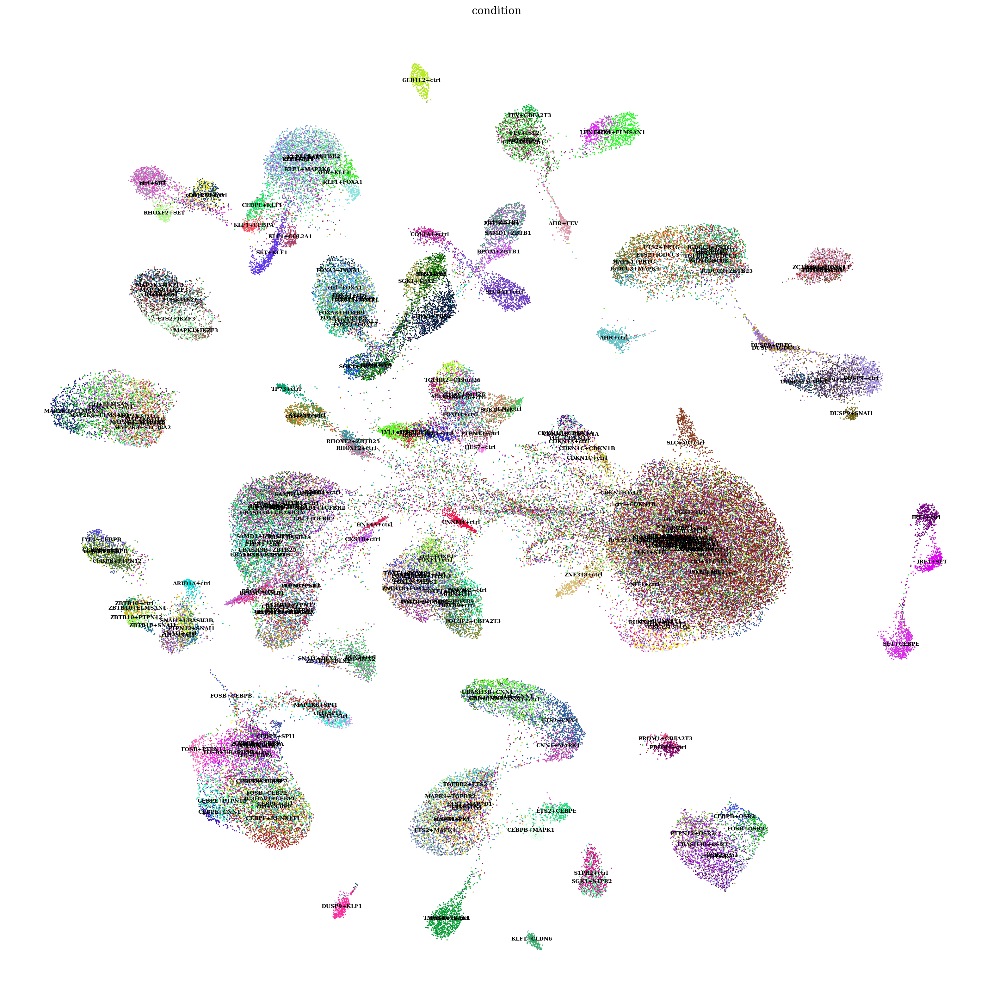

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

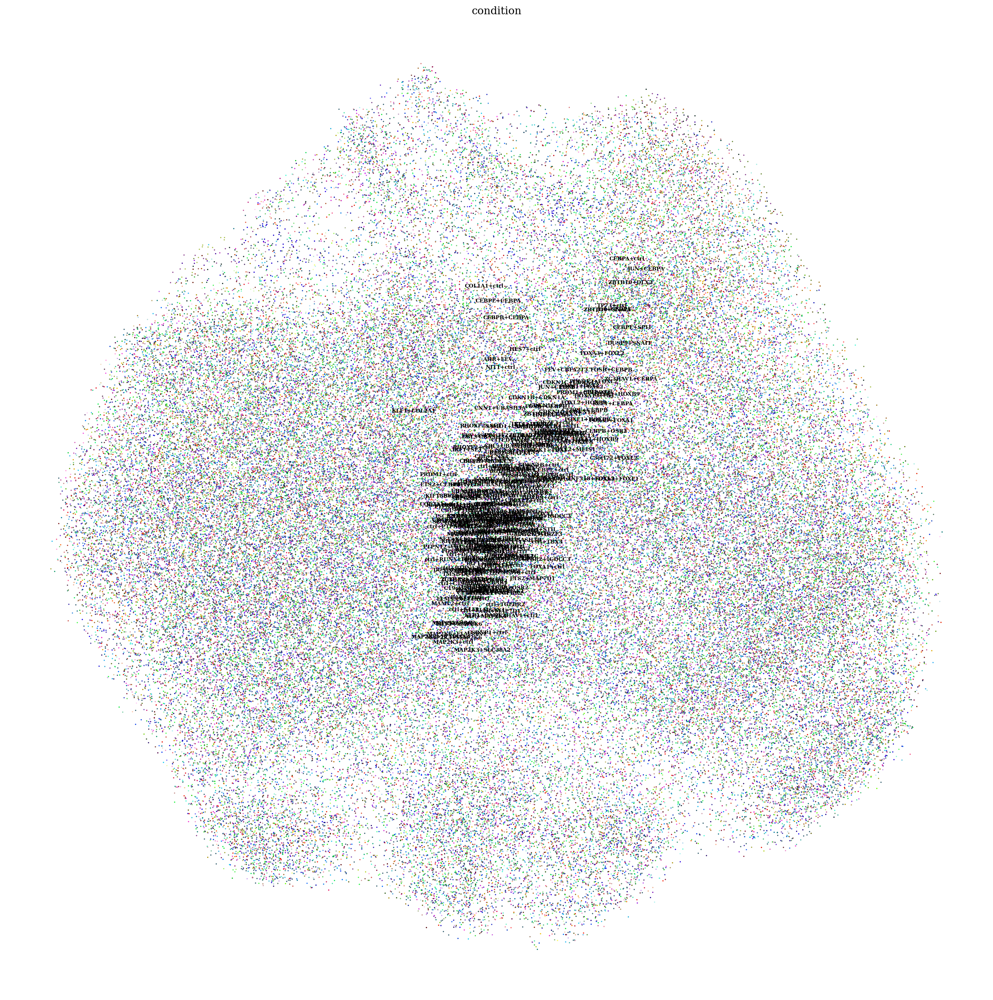

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()